# Road Segmentation Project

### ETH Computational Intelligence Lab 2024

The project is about image segmentation, which is an important topic in Computer Vision. It has applications in autonomous driving, reconstruction and medical domain, etc. In this project, you will focus on the road segmentation problem. **Given a set of RGB aerial images, we are asked to classify each 16x16 pixel patch as either containing road (1) or not (0).**

Below you will find three relevant baselines, from classical statical methods to some more sophisticated machine learning models for solving the problem. These baselines are in no sense optimal or exhaustive, but can serve more or less as a starting point for the project.


# Data Exploration

In this project, you are provided with training set with (**only!**) 144 RGB images of resolution 400 x 400 px, and you are given two types of labels pixel-wise: 1 for road, and 0 otherwise. Notice that here, the patch labeling are not directly available, instead, you need to calculate the average of the label, that if at least 25% of pixels are labeled as road, then it would be considered as a "road patch". As for the test set, it consists of 144 images of the same resolution as the original image.

For the purpose of illustration, we apply a **fixed training/validation split**. Notice that sticking a fixed split can significantly bias the validation metric, thus you may need to consider better validation strategy, and consider using all training images for the final submission.

**We will now load* the datasets and visualize them briefly.**

***:** unfortunately, the Kaggle API is structured to send individual HTTP requests for each of the files requested. Since we need to download around 300 files from Kaggle, it is very likely that we would run into HTTP 429 errors. For this reason, it is best to **manually [download all](https://www.kaggle.com/competitions/ethz-cil-road-segmentation-2024/data) the datasets as a .zip file** from the website and then upload it to this notebook from the Files tab on the left of this page. Once this is done, we can proceed with the rest of the notebook.

If you are considering to use Colab for your project, it would be faster to save a copy of the datasets directly in your Google Drive folders (or in a git repo) and import them from there.

In [1]:
# some basic imports

import math
import os
import re
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from random import sample
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
PATCH_SIZE = 16  # pixels per side of square patches
VAL_SIZE = 10  # size of the validation set (number of images)
CUTOFF = 0.25  # minimum average brightness for a mask patch to be classified as containing road

In [ ]:
ROOT_PATH = "/kaggle/input/ethz-cil-road-segmentation-2024/ethz-cil-road-segmentation-2024"

In [ ]:
def load_all_from_path(path):
    # loads all HxW .pngs contained in path as a 4D np.array of shape (n_images, H, W, 3)
    # images are loaded as floats with values in the interval [0., 1.]
    return np.stack([np.array(Image.open(f)) for f in sorted(glob(path + '/*.png'))]).astype(np.float32) / 255.


def show_first_n(imgs, masks, n=5):
    # visualizes the first n elements of a series of images and segmentation masks
    imgs_to_draw = min(5, len(imgs))
    fig, axs = plt.subplots(2, imgs_to_draw, figsize=(18.5, 6))
    for i in range(imgs_to_draw):
        axs[0, i].imshow(imgs[i])
        axs[1, i].imshow(masks[i])
        axs[0, i].set_title(f'Image {i}')
        axs[1, i].set_title(f'Mask {i}')
        axs[0, i].set_axis_off()
        axs[1, i].set_axis_off()
    plt.show()

In [ ]:
images = load_all_from_path(os.path.join(ROOT_PATH, 'training', 'images'))[:, :, :, :3]
masks = load_all_from_path(os.path.join(ROOT_PATH, 'training', 'groundtruth'))

# load massachusetts samples
# mas_images = load_all_from_path(os.path.join(ROOT_PATH, 'training_mas_small', 'input'))[:, :, :, :3]
# mas_masks = load_all_from_path(os.path.join(ROOT_PATH, 'training_mas_small', 'output'))

In [ ]:
_, val_images, _, val_masks = train_test_split(
    images, masks, test_size=0.2, random_state=42
)
train_images = images
train_masks = masks

In [ ]:
train_images, val_images, train_masks, val_masks = train_test_split(
    images, masks, test_size=0.1, random_state=42
)

We have mentioned that our task can also be seen as a classification problem. Let us visualize how each image can be broken up in patches and how we can compute labels from groundtruth masks.

In [ ]:
def image_to_patches(images, masks=None):
    # takes in a 4D np.array containing images and (optionally) a 4D np.array containing the segmentation masks
    # returns a 4D np.array with an ordered sequence of patches extracted from the image and (optionally) a np.array containing labels
    n_images = images.shape[0]  # number of images
    h, w = images.shape[1:3]  # shape of images
    assert (h % PATCH_SIZE) + (w % PATCH_SIZE) == 0  # make sure images can be patched exactly

    images = images[:,:,:,:3]

    h_patches = h // PATCH_SIZE
    w_patches = w // PATCH_SIZE

    patches = images.reshape((n_images, h_patches, PATCH_SIZE, w_patches, PATCH_SIZE, -1))
    patches = np.moveaxis(patches, 2, 3)
    patches = patches.reshape(-1, PATCH_SIZE, PATCH_SIZE, 3)
    if masks is None:
        return patches

    masks = masks.reshape((n_images, h_patches, PATCH_SIZE, w_patches, PATCH_SIZE, -1))
    masks = np.moveaxis(masks, 2, 3)
    labels = np.mean(masks, (-1, -2, -3)) > CUTOFF  # compute labels
    labels = labels.reshape(-1).astype(np.float32)
    return patches, labels


def show_patched_image(patches, labels, h_patches=25, w_patches=25):
    # reorders a set of patches in their original 2D shape and visualizes them
    fig, axs = plt.subplots(h_patches, w_patches, figsize=(18.5, 18.5))
    for i, (p, l) in enumerate(zip(patches, labels)):
        # the np.maximum operation paints patches labeled as road red
        axs[i // w_patches, i % w_patches].imshow(np.maximum(p, np.array([l.item(), 0., 0.])))
        axs[i // w_patches, i % w_patches].set_axis_off()
    plt.show()


# extract all patches and visualize those from the first image
train_patches, train_labels = image_to_patches(train_images, train_masks)
val_patches, val_labels = image_to_patches(val_images, val_masks)

Finally, let us compute predictions on test images. The code in this cell is adapted from `mask_to_submission.py`.

In [ ]:
def create_submission(labels, test_filenames, submission_filename):
    with open(submission_filename, 'w') as f:
        f.write('id,prediction\n')
        for fn, patch_array in zip(sorted(test_filenames), test_pred):
            img_number = int(re.search(r"(\d+)\.png$", fn).group(1))
            for i in range(patch_array.shape[0]):
                for j in range(patch_array.shape[1]):
                    f.write("{:03d}_{}_{},{}\n".format(img_number, j*PATCH_SIZE, i*PATCH_SIZE, int(patch_array[i, j])))


Define Dataset structure:


In [ ]:
import torch
from torch import nn
from torch.utils.tensorboard import SummaryWriter
from tqdm.notebook import tqdm

def np_to_tensor(x, device):
    # allocates tensors from np.arrays
    if device == 'cpu':
        return torch.from_numpy(x).cpu()
    else:
        return torch.from_numpy(x).contiguous().pin_memory().to(device=device, non_blocking=True)


class ImageDataset(torch.utils.data.Dataset):
    # dataset class that deals with loading the data and making it available by index.

    def __init__(self, is_train, device, use_patches=True, resize_to=(400, 400), augmentation=None, preprocessing=None,):
        self.is_train = is_train
        self.device = device
        self.use_patches = use_patches
        self.resize_to=resize_to
        self.x, self.y, self.n_samples = None, None, None
        self._load_data()
        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def _load_data(self):  # not very scalable, but good enough for now
        if self.is_train == "mas":
            self.x = mas_images
            self.y = mas_masks
        else:
            self.x = train_images if self.is_train else val_images
            self.y = train_masks if self.is_train else val_masks
        if self.use_patches:  # split each image into patches
            self.x, self.y = image_to_patches(self.x, self.y)
        elif self.resize_to != (self.x.shape[1], self.x.shape[2]):  # resize images
            self.x = np.stack([cv2.resize(img, dsize=self.resize_to) for img in self.x], 0)
            self.y = np.stack([cv2.resize(mask, dsize=self.resize_to) for mask in self.y], 0)
        self.x = np.moveaxis(self.x, -1, 1)  # pytorch works with CHW format instead of HWC
        self.n_samples = len(self.x)

    def _preprocess(self, x, y):
        # to keep things simple we will not apply transformations to each sample,
        # but it would be a very good idea to look into preprocessing
        return x, y

    def __getitem__(self, item):
        image = self.x[item]
        mask = self.y[[item]]

        if self.augmentation:
            image, mask = self.augmentation(image, mask)

        if self.preprocessing:
            image, mask = self.preprocessing(image, mask)

        return self._preprocess(np_to_tensor(image, self.device), np_to_tensor(mask, self.device))

    def __len__(self):
        return self.n_samples


def show_val_samples(x, y, y_hat, segmentation=False):
    # training callback to show predictions on validation set
    imgs_to_draw = min(5, len(x))
    if x.shape[-2:] == y.shape[-2:]:  # segmentation
        fig, axs = plt.subplots(3, imgs_to_draw, figsize=(18.5, 12))
        for i in range(imgs_to_draw):
            axs[0, i].imshow(np.moveaxis(x[i], 0, -1))
            axs[1, i].imshow(np.concatenate([np.moveaxis(y_hat[i], 0, -1)] * 3, -1))
            axs[2, i].imshow(np.concatenate([np.moveaxis(y[i], 0, -1)]*3, -1))
            axs[0, i].set_title(f'Sample {i}')
            axs[1, i].set_title(f'Predicted {i}')
            axs[2, i].set_title(f'True {i}')
            axs[0, i].set_axis_off()
            axs[1, i].set_axis_off()
            axs[2, i].set_axis_off()
    else:  # classification
        fig, axs = plt.subplots(1, imgs_to_draw, figsize=(18.5, 6))
        for i in range(imgs_to_draw):
            axs[i].imshow(np.moveaxis(x[i], 0, -1))
            axs[i].set_title(f'True: {np.round(y[i]).item()}; Predicted: {np.round(y_hat[i]).item()}')
            axs[i].set_axis_off()
    plt.show()

device = 'cuda' if torch.cuda.is_available() else 'cpu'

2024-07-31 10:53:51.745858: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-31 10:53:51.745971: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-31 10:53:51.874190: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Here we define a general training loop.

In [ ]:
def train(train_dataloader, eval_dataloader, model, loss_fn, metric_fns, optimizer, n_epochs):
    # training loop
    logdir = './tensorboard/net'
    writer = SummaryWriter(logdir)  # tensorboard writer (can also log images)

    history = {}  # collects metrics at the end of each epoch

    for epoch in range(n_epochs):  # loop over the dataset multiple times

        # initialize metric list
        metrics = {'loss': [], 'val_loss': []}
        for k, _ in metric_fns.items():
            metrics[k] = []
            metrics['val_'+k] = []

        pbar = tqdm(train_dataloader, desc=f'Epoch {epoch+1}/{n_epochs}')
        # training
        model.train()
        for (x, y) in pbar:
            optimizer.zero_grad()  # zero out gradients
            y_hat = model(x)  # forward pass
            loss = loss_fn(y_hat, y)
            loss.backward()  # backward pass
            optimizer.step()  # optimize weights

            # log partial metrics
            metrics['loss'].append(loss.item())
            for k, fn in metric_fns.items():
                metrics[k].append(fn(y_hat, y).item())
            pbar.set_postfix({k: sum(v)/len(v) for k, v in metrics.items() if len(v) > 0})

        # validation
        model.eval()
        with torch.no_grad():  # do not keep track of gradients
            for (x, y) in eval_dataloader:
                y_hat = model(x)  # forward pass
                loss = loss_fn(y_hat, y)

                # log partial metrics
                metrics['val_loss'].append(loss.item())
                for k, fn in metric_fns.items():
                    metrics['val_'+k].append(fn(y_hat, y).item())

        # summarize metrics, log to tensorboard and display
        history[epoch] = {k: sum(v) / len(v) for k, v in metrics.items()}
        for k, v in history[epoch].items():
          writer.add_scalar(k, v, epoch)
        print(' '.join(['\t- '+str(k)+' = '+str(v)+'\n ' for (k, v) in history[epoch].items()]))
        show_val_samples(x.detach().cpu().numpy(), y.detach().cpu().numpy(), y_hat.detach().cpu().numpy())

    print('Finished Training')
    # plot loss curves
    plt.plot([v['loss'] for k, v in history.items()], label='Training Loss')
    plt.plot([v['val_loss'] for k, v in history.items()], label='Validation Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend()
    plt.show()

In [ ]:
# METRICS:

def accuracy_fn(y_hat, y):
    # computes classification accuracy
    return (y_hat.round() == y.round()).float().mean()

def patch_accuracy_fn(y_hat, y):
    # computes accuracy weighted by patches (metric used on Kaggle for evaluation)
    h_patches = y.shape[-2] // PATCH_SIZE
    w_patches = y.shape[-1] // PATCH_SIZE
    patches_hat = y_hat.reshape(-1, 1, h_patches, PATCH_SIZE, w_patches, PATCH_SIZE).mean((-1, -3)) > CUTOFF
    patches = y.reshape(-1, 1, h_patches, PATCH_SIZE, w_patches, PATCH_SIZE).mean((-1, -3)) > CUTOFF
    return (patches == patches_hat).float().mean()

THE MAIN MODEL STARTS HERE:

In [ ]:
!pip install -q git+https://github.com/qubvel/segmentation_models.pytorch
import segmentation_models_pytorch as smp
import segmentation_models_pytorch.utils.metrics

import torchvision.transforms as transforms

device = 'cuda' if torch.cuda.is_available() else 'cpu'

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [ ]:
# timm-efficientnet-l2 not working, too big (with unet++)
# deeplapv3+ with effnet-b7 worse performance

torch.cuda.empty_cache()

ENCODER = 'efficientnet-b7'
ENCODER_WEIGHTS = 'imagenet'
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multiclass segmentation

model = smp.UnetPlusPlus(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    classes=1,
    activation='sigmoid',
)

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b7-dcc49843.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b7-dcc49843.pth
100%|██████████| 254M/254M [00:02<00:00, 97.8MB/s] 


In [ ]:
import random
from torchvision import transforms
from PIL import Image
import random
import numpy as np
import matplotlib.pyplot as plt

class DualTransform:
    def __init__(self, base_transform):
        self.base_transform = base_transform

    def __call__(self, img, label):
        # Convert numpy arrays to PIL images
        img = Image.fromarray((img * 255).astype(np.uint8).transpose(1, 2, 0))  # Convert (3, H, W) to (H, W, 3)
        label = Image.fromarray((label[0] * 255).astype(np.uint8), mode='L')     # Convert (1, 384, 384) to (384, 384)

        seed = random.randint(0, 2**32)
        random.seed(seed)
        torch.manual_seed(seed)
        img = self.base_transform(img)
        random.seed(seed)
        torch.manual_seed(seed)
        label = self.base_transform(label)

        # Convert PIL images back to numpy arrays
        img = np.array(img).transpose(2, 0, 1).astype(np.float32) / 255. # Convert back to (3, 384, 384)
        label = np.array(label)[np.newaxis, ...].astype(np.float32) / 255. # Convert back to (1, 384, 384)
        return img, label

base_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(90),
#     transforms.RandomResizedCrop(size=384, scale=(0.8, 1.0)),
])

dual_transform = DualTransform(base_transform)

In [ ]:
# reshape the image to simplify the handling of skip connections and maxpooling
train_dataset_df = ImageDataset('training', device, use_patches=False, resize_to=(384, 384), augmentation=None)
train_dataset_aug1 = ImageDataset('training', device, use_patches=False, resize_to=(384, 384), augmentation=dual_transform)
train_dataset_aug2 = ImageDataset('training', device, use_patches=False, resize_to=(384, 384), augmentation=dual_transform)
# train_dataset_mas = ImageDataset('mas', device, use_patches=False, resize_to=(384, 384), augmentation=None)

train_dataset = torch.utils.data.ConcatDataset([train_dataset_df, train_dataset_aug1, train_dataset_aug2])
val_dataset = ImageDataset('validation', device, use_patches=False, resize_to=(384, 384))
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=4, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=4, shuffle=True)

Basic training with given train method.

In [ ]:
model.to(device)
loss_fn = nn.BCELoss() # TODO: here maybe try different loss function
metric_fns = {'acc': accuracy_fn, 'patch_acc': patch_accuracy_fn}
optimizer = torch.optim.Adam(model.parameters())
n_epochs = 50
train(train_dataloader, val_dataloader, model, loss_fn, metric_fns, optimizer, n_epochs)

In [ ]:
torch.save(model, '/content/drive/MyDrive/Unet_eff_aug2_mas_(big)_35ep.pth')

----
Different Training Procedure

[This was used for the most recent submission. Based on the smp library. Tries to minimize the dice loss]

In [ ]:
model.to(device)

EPOCHS = 100

loss = smp.utils.losses.DiceLoss()

metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
    smp.utils.metrics.Accuracy(threshold=0.5),
    smp.utils.metrics.Fscore(threshold=0.5),
]

optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=0.001),
])

In [ ]:
train_epoch = smp.utils.train.TrainEpoch(
    model,
    loss=loss,
    metrics=metrics,
    optimizer=optimizer,
    device=device,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss,
    metrics=metrics,
    device=device,
    verbose=True,
)

In [ ]:
%%time

best_iou_score = 0.0
train_logs_list, valid_logs_list = [], []

for i in range(0, EPOCHS):

    # Perform training & validation
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_dataloader)
    valid_logs = valid_epoch.run(val_dataloader)
    train_logs_list.append(train_logs)
    valid_logs_list.append(valid_logs)

    # Save model if a better val IoU score is obtained
    if best_iou_score < valid_logs['iou_score']:
        best_iou_score = valid_logs['iou_score']
        torch.save(model, './best_model.pth')
        print('Model saved!')

In [ ]:
model = torch.load('/kaggle/input/basemodel/pytorch/default/1/basemodel.pth')
model = model.to(device)

In [ ]:
torch.save(model, '/content/drive/MyDrive/Unet_eff_aug2_mas_(big)_100ep_dice.pth')

----
Finish of procedure. Next cell creates submission.

In [ ]:
# predict on test set
test_path = os.path.join(ROOT_PATH, 'test', 'images')

test_filenames = (glob(test_path + '/*.png'))
test_images = load_all_from_path(test_path)
batch_size = test_images.shape[0]
size = test_images.shape[1:3]
# we also need to resize the test images. This might not be the best ideas depending on their spatial resolution.
test_images = np.stack([cv2.resize(img, dsize=(384, 384)) for img in test_images], 0)
test_images = test_images[:, :, :, :3]
test_images = np_to_tensor(np.moveaxis(test_images, -1, 1), device)
test_pred = [model(t).detach().cpu().numpy() for t in test_images.unsqueeze(1)]
test_pred = np.concatenate(test_pred, 0)
test_pred= np.moveaxis(test_pred, 1, -1)  # CHW to HWC
test_pred = np.stack([cv2.resize(img, dsize=size) for img in test_pred], 0)  # resize to original shape
# now compute labels
test_pred = test_pred.reshape((-1, size[0] // PATCH_SIZE, PATCH_SIZE, size[0] // PATCH_SIZE, PATCH_SIZE))
test_pred = np.moveaxis(test_pred, 2, 3)
test_pred = np.round(np.mean(test_pred, (-1, -2)) > CUTOFF)
create_submission(test_pred, test_filenames, submission_filename='unet_eff_basemodel_submission.csv')

----
**POST PROC STARTS HERE**

### Gaussian Kernel

In [ ]:
import torch
import torch.nn.functional as F
import numpy as np
import math

def gaussian_kernel(size: int, sigma: float):
    """Generate a 2D Gaussian kernel."""
    kernel = torch.zeros((size, size))
    center = size // 2

    for i in range(size):
        for j in range(size):
            diff = (i - center) ** 2 + (j - center) ** 2
            kernel[i, j] = math.exp(-diff / (2 * sigma ** 2))

    kernel /= kernel.sum()
    return kernel

def apply_gaussian_filter(batch: torch.Tensor, kernel_size: int, sigma: float):
    """Apply Gaussian filter to a batch of tensors."""
    batch_size, channels, height, width = batch.shape
    kernel = gaussian_kernel(kernel_size, sigma).unsqueeze(0).unsqueeze(0)
    kernel = kernel.repeat(channels, 1, 1, 1).to(batch.device)

    padding = kernel_size // 2
    filtered_batch = F.conv2d(batch, kernel, padding=padding, groups=channels)
    return filtered_batch

gaussian_kernel_size = 5
gaussian_sigma = 1.0

In [ ]:
def create_submission(labels, test_filenames, submission_filename):
    with open(submission_filename, 'w') as f:
        f.write('id,prediction\n')
        for fn, patch_array in zip(sorted(test_filenames), test_pred):
            img_number = int(re.search(r"(\d+)\.png$", fn).group(1))
            for i in range(patch_array.shape[0]):
                for j in range(patch_array.shape[1]):
                    f.write("{:03d}_{}_{},{}\n".format(img_number, j*PATCH_SIZE, i*PATCH_SIZE, int(patch_array[i, j])))
test_path = os.path.join(ROOT_PATH, 'test', 'images')
# predict on test set
test_filenames = (glob(test_path + '/*.png'))
test_images = load_all_from_path(test_path)
batch_size = test_images.shape[0]
size = test_images.shape[1:3]
# we also need to resize the test images. This might not be the best ideas depending on their spatial resolution.
test_images = np.stack([cv2.resize(img, dsize=(384, 384)) for img in test_images], 0)
test_images = test_images[:, :, :, :3]
test_images = np_to_tensor(np.moveaxis(test_images, -1, 1), device)

# predict on test set in batches to avoid OOM error
test_pred = []
batch_size = 16  # Adjust this based on your GPU memory
for i in range(0, test_images.shape[0], batch_size):
    batch = test_images[i:i + batch_size]
    with torch.no_grad():
        batch_pred = model(batch.to(device))
        batch_pred = apply_gaussian_filter(batch_pred, gaussian_kernel_size, gaussian_sigma)
    test_pred.append(batch_pred.detach().cpu().numpy())


# test_pred = [model(t) for t in test_images.unsqueeze(1)]
# test_pred = [G_Unet(t).detach().cpu().numpy() for t in test_pred]
test_pred = np.concatenate(test_pred, 0)
test_pred= np.moveaxis(test_pred, 1, -1)  # CHW to HWC
test_pred = np.stack([cv2.resize(img, dsize=size) for img in test_pred], 0)  # resize to original shape
# now compute labels
test_pred = test_pred.reshape((-1, size[0] // PATCH_SIZE, PATCH_SIZE, size[0] // PATCH_SIZE, PATCH_SIZE))
test_pred = np.moveaxis(test_pred, 2, 3)
test_pred = np.round(np.mean(test_pred, (-1, -2)) > CUTOFF)
create_submission(test_pred, test_filenames, submission_filename='eff_unetpp_fixed_gaussian_kernel.csv')

### CycleGAN

In [ ]:
import os
import numpy as np
import torch
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

# Define transformations
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((384, 384)),
    transforms.ToTensor(),
])

# Load datasets
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, predicted_maps, train_masks, train_imgs, transform=None):
        self.predicted_maps = predicted_maps
        self.train_masks = train_masks
        self.train_imgs = train_imgs
        self.transform = transform

    def __len__(self):
        return len(self.predicted_maps)

    def __getitem__(self, idx):
        # concat original image to predicted maps so that the model can have a reference to fill in blank spaces
        # input_imgs = torch.concat((self.predicted_maps[idx].unsqueeze(0), self.train_imgs[idx]), dim=0)
        train_imgs = self.train_imgs[idx]
        input_imgs = self.predicted_maps[idx]
        target_masks = self.train_masks[idx]
        if self.transform:
            input_imgs = self.transform(input_imgs)
            target_masks = self.transform(target_masks)
            train_imgs = self.transform(train_imgs)
        return input_imgs, target_masks, train_imgs

train_images_A = np.stack([cv2.resize(img, dsize=(384, 384)) for img in train_images], 0)
train_images_A = train_images_A[:, :, :, :3]
train_images_A = np_to_tensor(np.moveaxis(train_images_A, -1, 1), device)
predicted_maps = torch.Tensor([model(t).detach().cpu().numpy() for t in train_images_A.unsqueeze(1)]).squeeze(2).squeeze(1)
dataset = CustomDataset(predicted_maps, train_masks, train_images_A.detach().cpu(), transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

val_images_A = np.stack([cv2.resize(img, dsize=(384, 384)) for img in val_images], 0)
val_images_A = val_images_A[:, :, :, :3]
val_images_A = np_to_tensor(np.moveaxis(val_images_A, -1, 1), device)
predicted_val_maps = torch.Tensor([model(t).detach().cpu().numpy() for t in val_images_A.unsqueeze(1)]).squeeze(2).squeeze(1)

In [ ]:
import torch.nn as nn
import itertools

# Discriminator model
class DiscriminatorA(nn.Module):
    def __init__(self):
        super(DiscriminatorA, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

class DiscriminatorB(nn.Module):
    def __init__(self):
        super(DiscriminatorB, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, kernel_size=4, stride=1, padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)

# ===================================================================================================================================================

class Block(nn.Module):
    # a repeating structure composed of two convolutional layers with batch normalization and ReLU activations
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(nn.Conv2d(in_channels=in_ch, out_channels=out_ch, kernel_size=3, padding=2, dilation=2),
                                   nn.ReLU(),
                                   nn.BatchNorm2d(out_ch),
                                   nn.Conv2d(in_channels=out_ch, out_channels=out_ch, kernel_size=3, padding=3, dilation=3),
                                   nn.ReLU())

    def forward(self, x):
        return self.block(x)


class GUNet(nn.Module):
    # UNet-like architecture for single class semantic segmentation.
    def __init__(self, chs=(4,64,128,256,512,1024)):
        super().__init__()
        enc_chs = chs  # number of channels in the encoder
        dec_chs = chs[::-1][:-1]  # number of channels in the decoder
        self.enc_blocks = nn.ModuleList([Block(in_ch, out_ch) for in_ch, out_ch in zip(enc_chs[:-1], enc_chs[1:])])  # encoder blocks
        self.pool = nn.MaxPool2d(2)  # pooling layer (can be reused as it will not be trained)
        self.upconvs = nn.ModuleList([nn.ConvTranspose2d(in_ch, out_ch, 2, 2) for in_ch, out_ch in zip(dec_chs[:-1], dec_chs[1:])])  # deconvolution
        self.dec_blocks = nn.ModuleList([Block(in_ch, out_ch) for in_ch, out_ch in zip(dec_chs[:-1], dec_chs[1:])])  # decoder blocks
        self.head = nn.Sequential(nn.Conv2d(dec_chs[-1], 1, 1), nn.Sigmoid()) # 1x1 convolution for producing the output

    def forward(self, x):
        # encode
        enc_features = []
        for block in self.enc_blocks[:-1]:
            x = block(x)  # pass through the block
            enc_features.append(x)  # save features for skip connections
            x = self.pool(x)  # decrease resolution
        x = self.enc_blocks[-1](x)
        # decode
        for block, upconv, feature in zip(self.dec_blocks, self.upconvs, enc_features[::-1]):
            x = upconv(x)  # increase resolution
            x = torch.cat([x, feature], dim=1)  # concatenate skip features
            x = block(x)  # pass through the block
        return self.head(x)  # reduce to 1 channel


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

G_A2B = GUNet().to(device)
G_B2A = GUNet().to(device)
D_A = DiscriminatorA().to(device)
D_B = DiscriminatorB().to(device)

# Optimizers
optimizer_G = torch.optim.Adam(itertools.chain(G_A2B.parameters(), G_B2A.parameters()), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [ ]:
criterion_GAN = nn.BCELoss()
criterion_cycle = nn.L1Loss()

Epoch [0/50] Batch [128/129] Loss D_B: 1.3338 Loss G: 2.2766


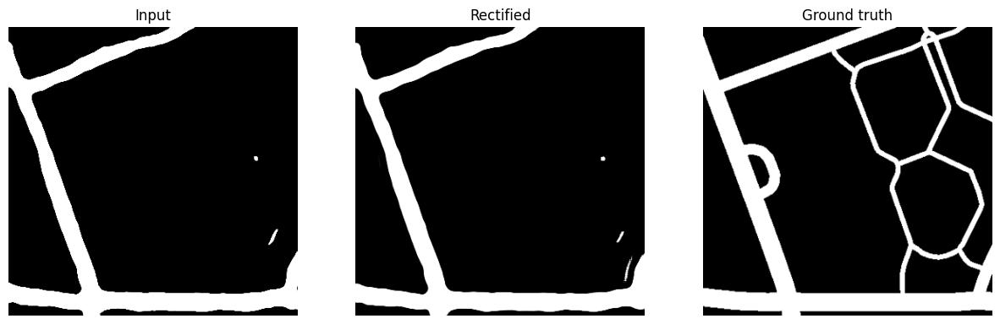

Epoch [1/50] Batch [128/129] Loss D_B: 1.1510 Loss G: 1.9490


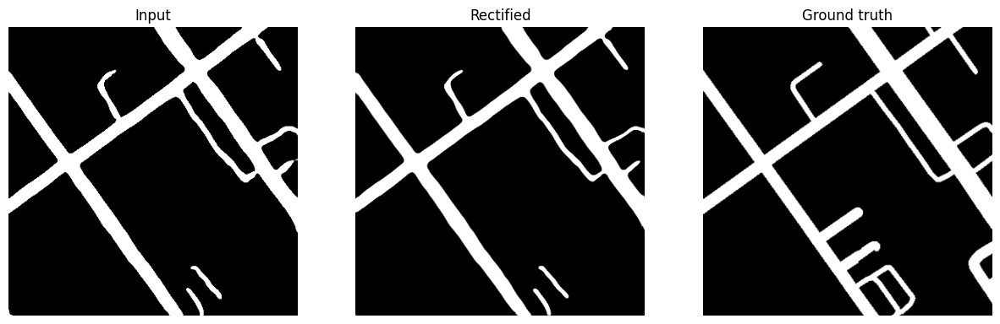

Epoch [2/50] Batch [128/129] Loss D_B: 1.3797 Loss G: 2.3355


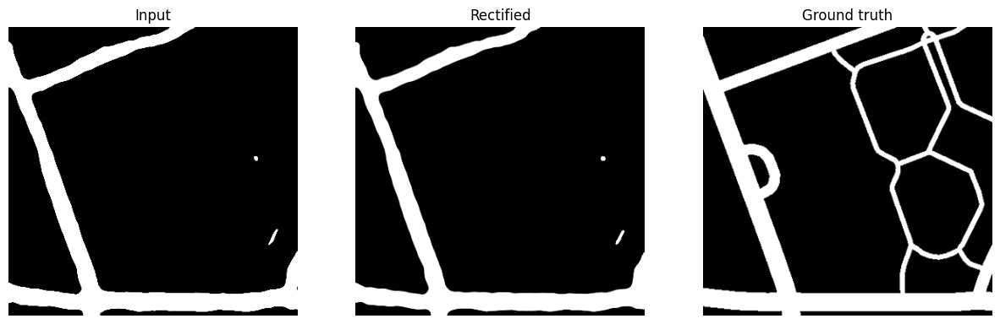

Epoch [3/50] Batch [128/129] Loss D_B: 1.5253 Loss G: 1.6882


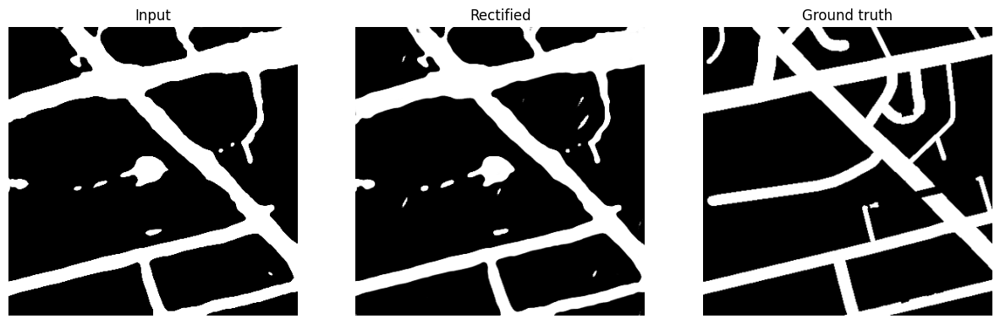

Epoch [4/50] Batch [128/129] Loss D_B: 1.4295 Loss G: 1.8275


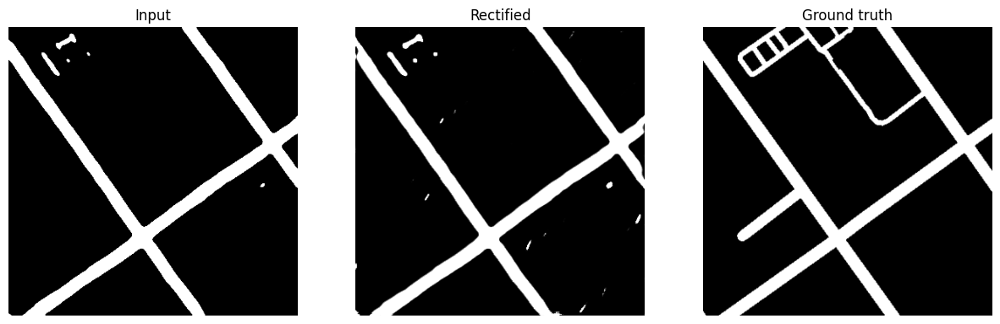

Epoch [5/50] Batch [128/129] Loss D_B: 1.3958 Loss G: 1.4706


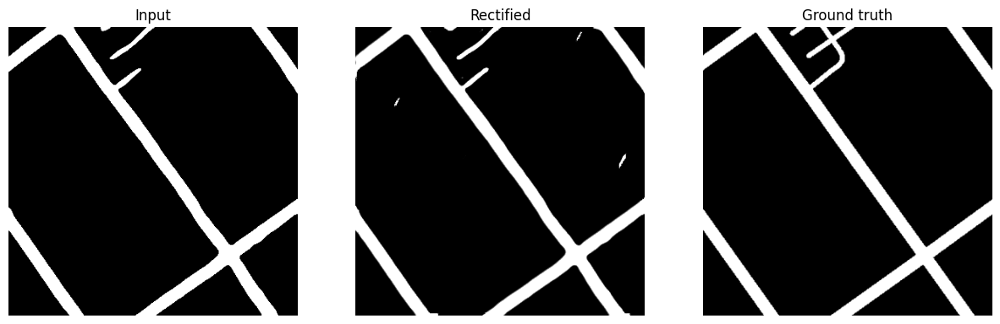

Epoch [6/50] Batch [128/129] Loss D_B: 1.3573 Loss G: 1.7229


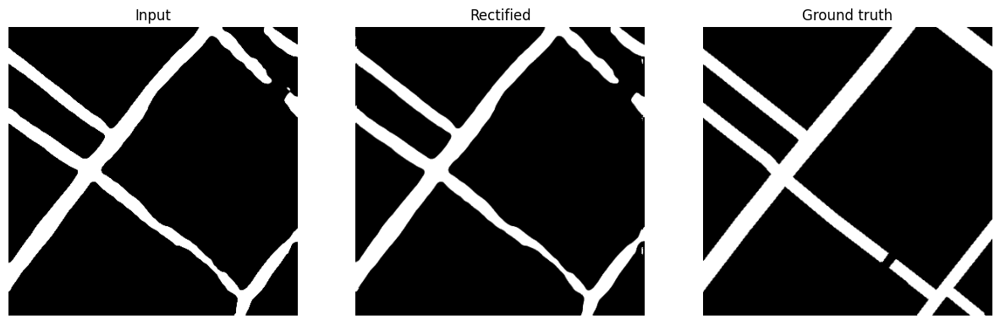

Epoch [7/50] Batch [128/129] Loss D_B: 1.3658 Loss G: 1.4900


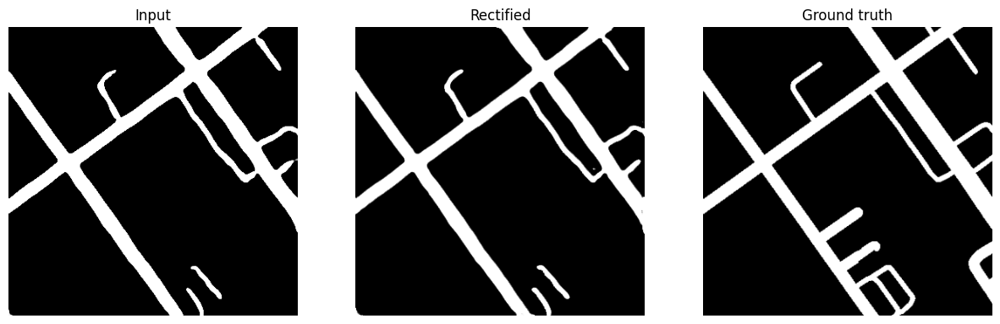

Epoch [8/50] Batch [128/129] Loss D_B: 1.3678 Loss G: 1.4842


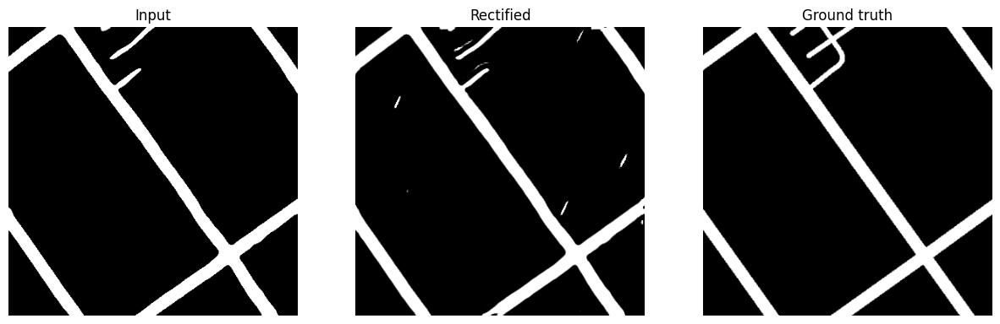

Epoch [9/50] Batch [128/129] Loss D_B: 0.9523 Loss G: 3.5983


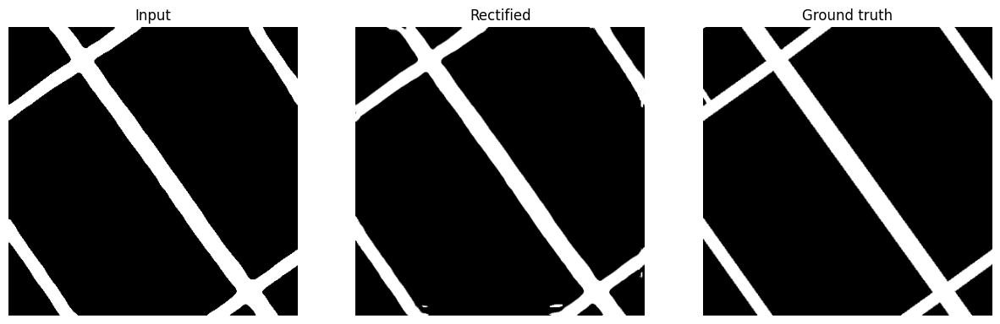

Epoch [10/50] Batch [128/129] Loss D_B: 1.4121 Loss G: 2.0757


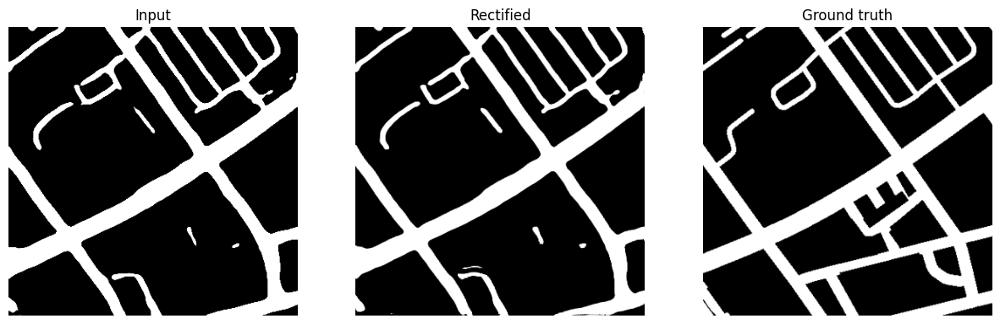

Epoch [11/50] Batch [128/129] Loss D_B: 1.3650 Loss G: 1.7368


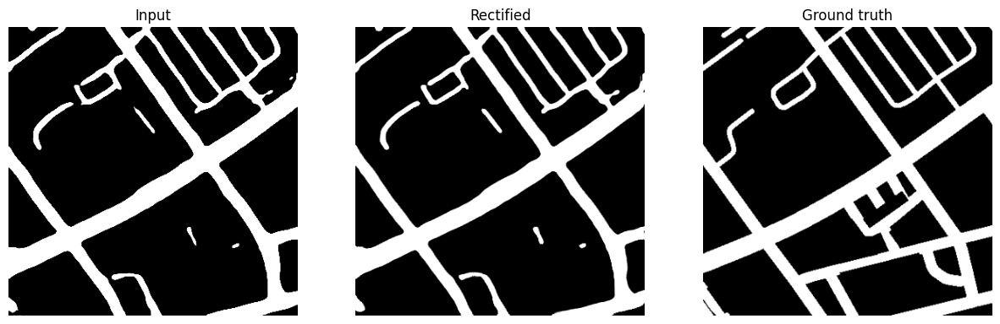

Epoch [12/50] Batch [128/129] Loss D_B: 1.1616 Loss G: 2.1291


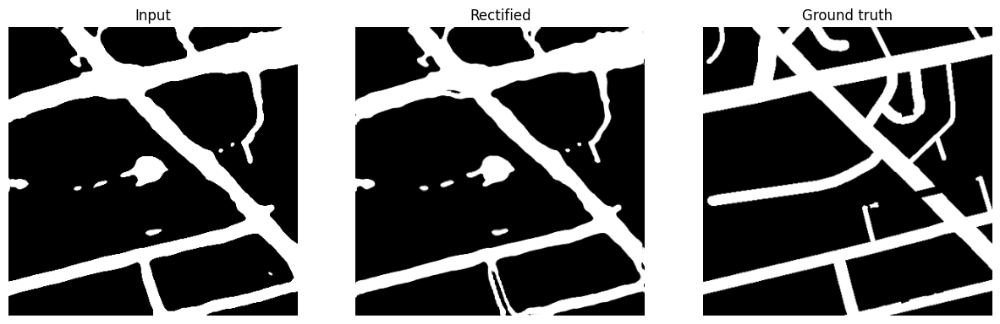

Epoch [13/50] Batch [128/129] Loss D_B: 1.3499 Loss G: 2.5896


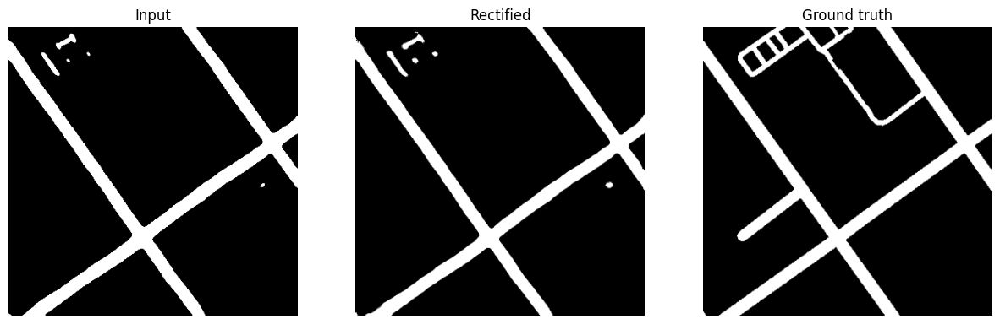

Epoch [14/50] Batch [128/129] Loss D_B: 1.2215 Loss G: 3.1362


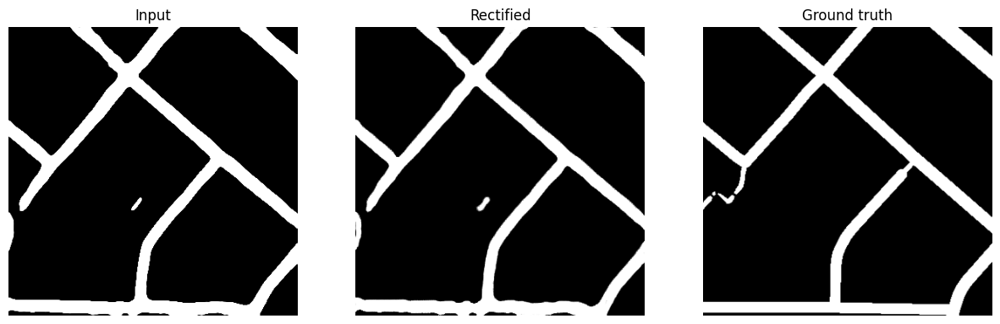

Epoch [15/50] Batch [128/129] Loss D_B: 1.1887 Loss G: 1.8853


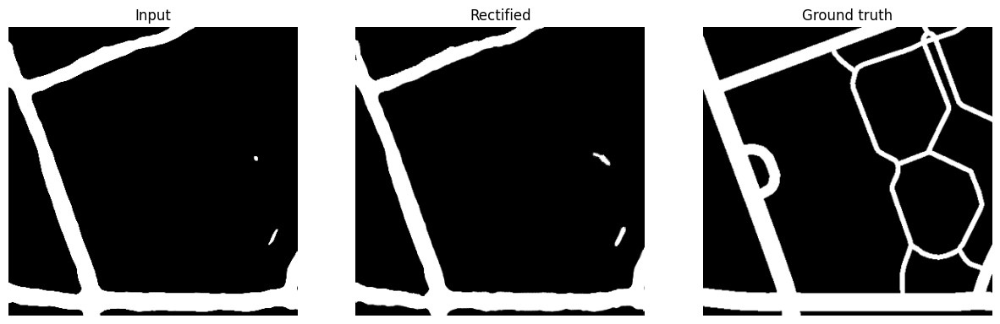

Epoch [16/50] Batch [128/129] Loss D_B: 1.1804 Loss G: 2.2116


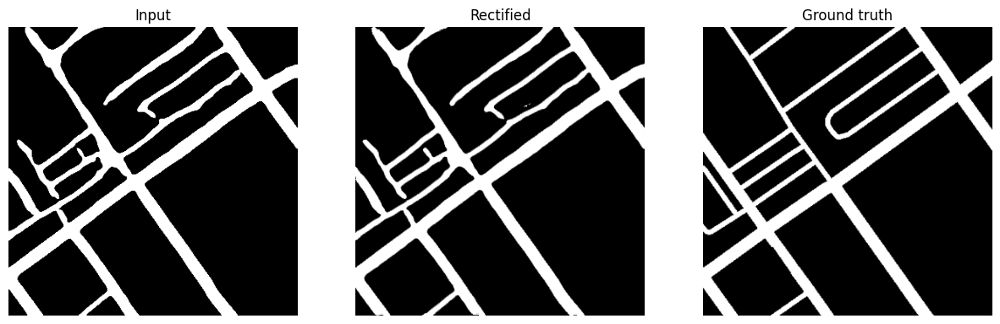

Epoch [17/50] Batch [128/129] Loss D_B: 1.2392 Loss G: 2.3011


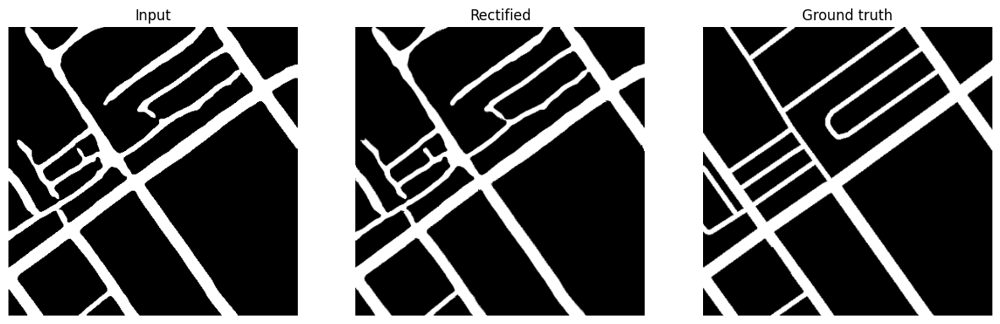

Epoch [18/50] Batch [128/129] Loss D_B: 0.9464 Loss G: 2.6927


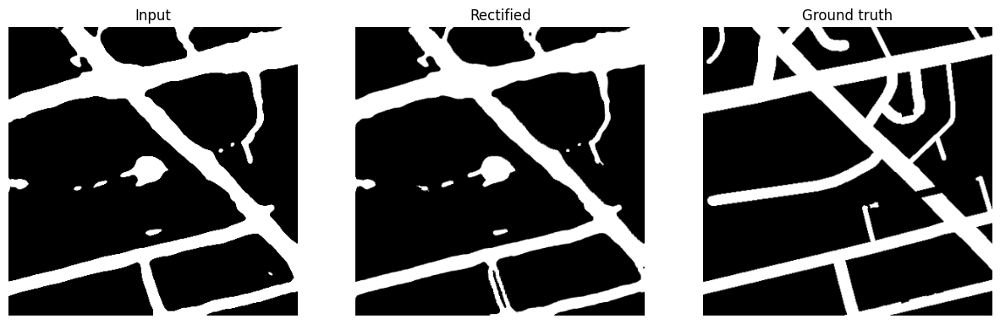

Epoch [19/50] Batch [128/129] Loss D_B: 0.9675 Loss G: 2.7375


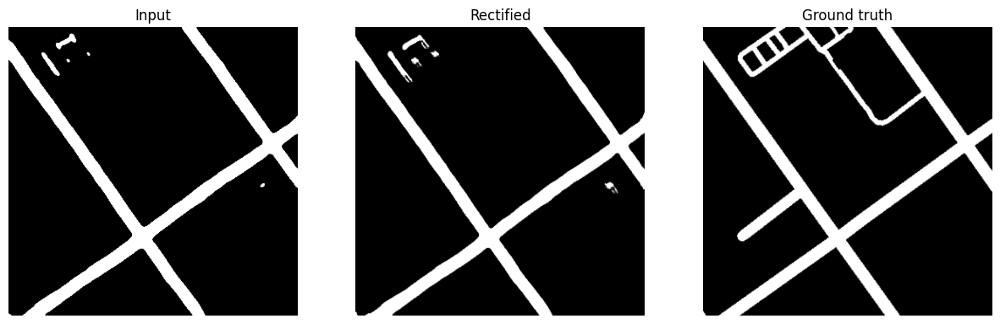

Epoch [20/50] Batch [128/129] Loss D_B: 0.6594 Loss G: 2.8389


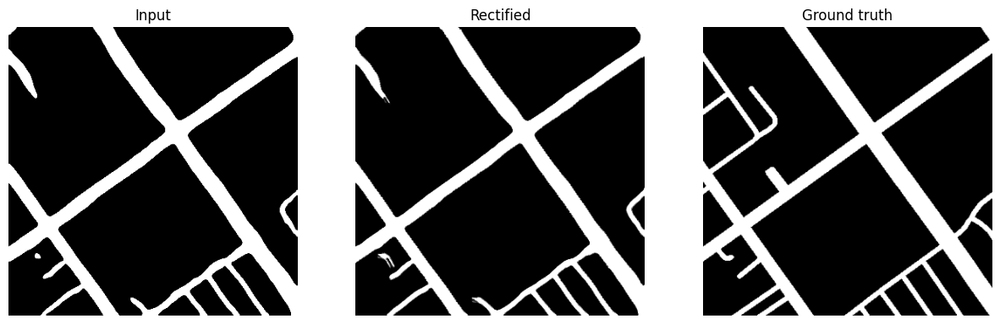

Epoch [21/50] Batch [128/129] Loss D_B: 0.6905 Loss G: 4.0461


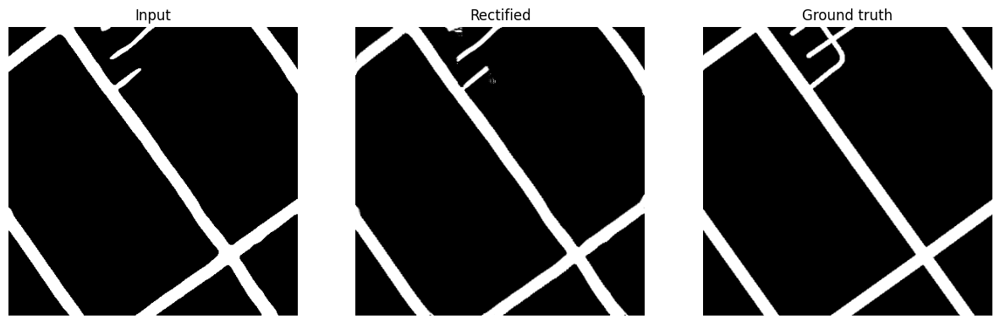

Epoch [22/50] Batch [128/129] Loss D_B: 1.3048 Loss G: 1.5950


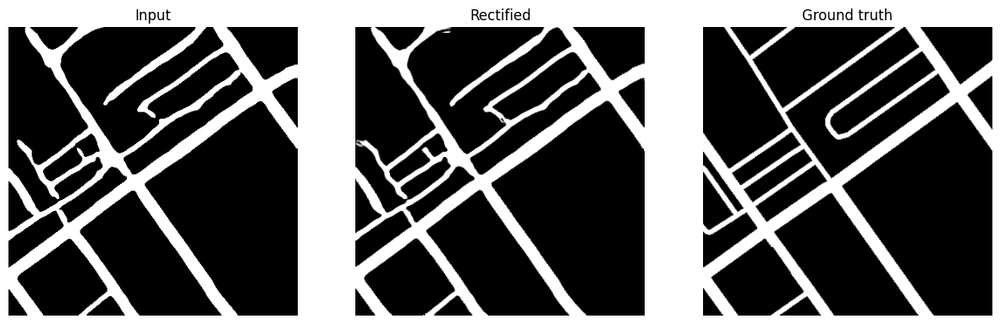

Epoch [23/50] Batch [128/129] Loss D_B: 0.7379 Loss G: 2.5456


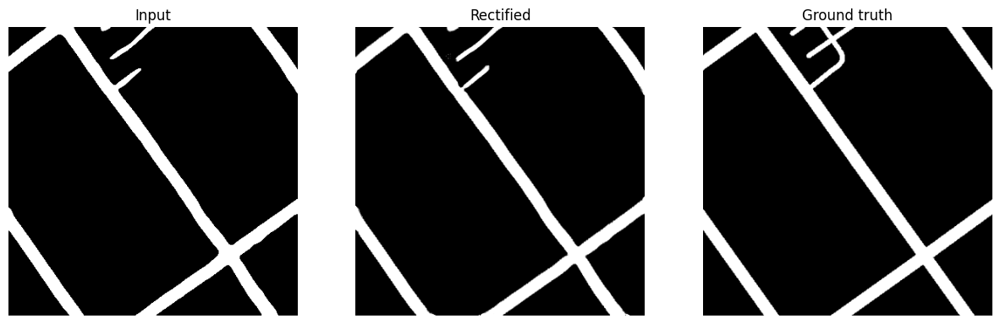

Epoch [24/50] Batch [128/129] Loss D_B: 1.1008 Loss G: 1.8568


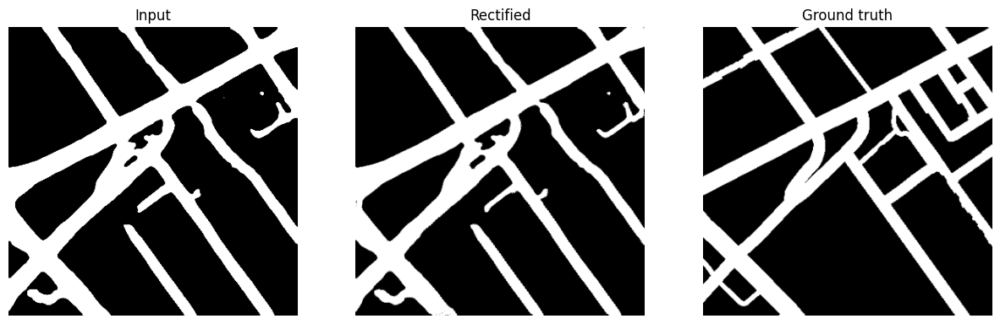

Epoch [25/50] Batch [128/129] Loss D_B: 0.9555 Loss G: 2.6420


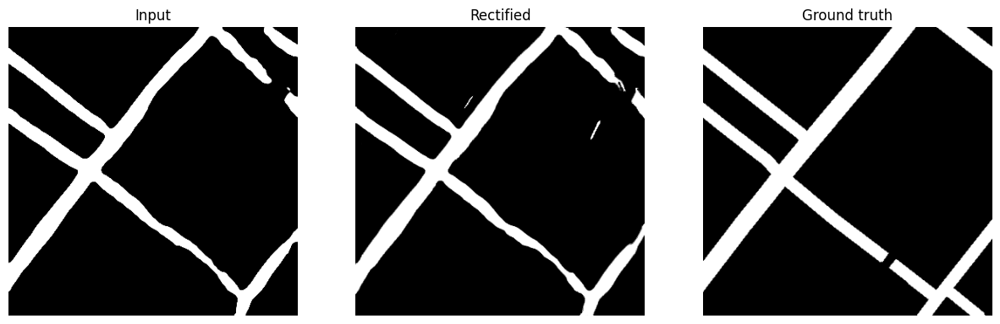

Epoch [26/50] Batch [128/129] Loss D_B: 1.0164 Loss G: 2.6175


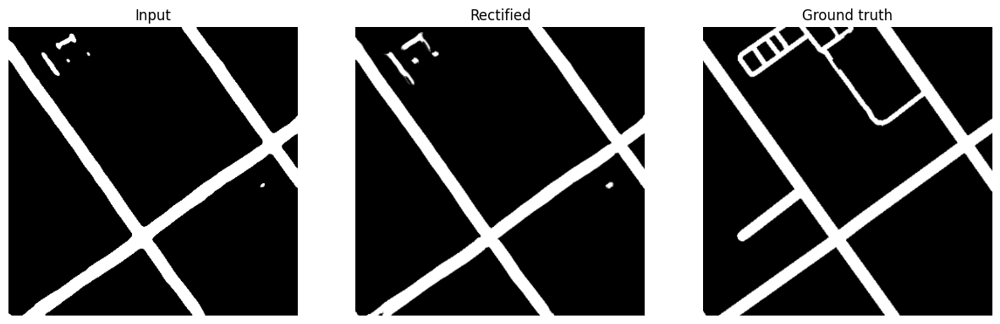

Epoch [27/50] Batch [128/129] Loss D_B: 0.8299 Loss G: 2.6434


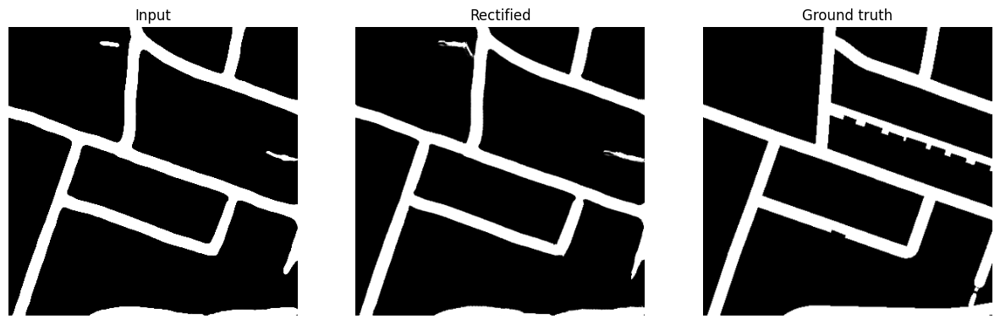

Epoch [28/50] Batch [128/129] Loss D_B: 1.3404 Loss G: 1.9104


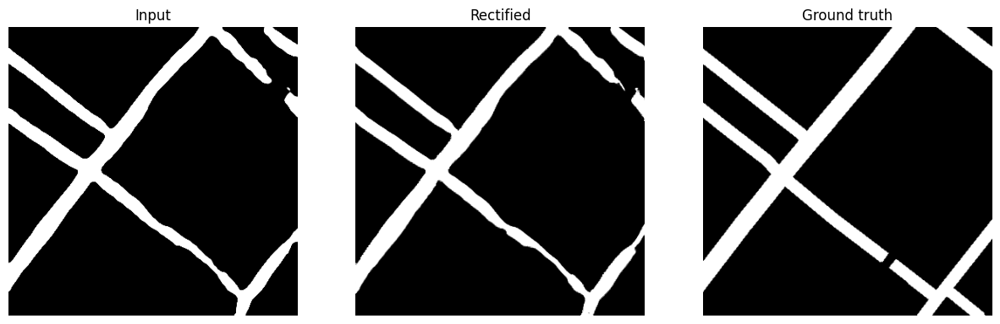

Epoch [29/50] Batch [128/129] Loss D_B: 0.8854 Loss G: 2.1723


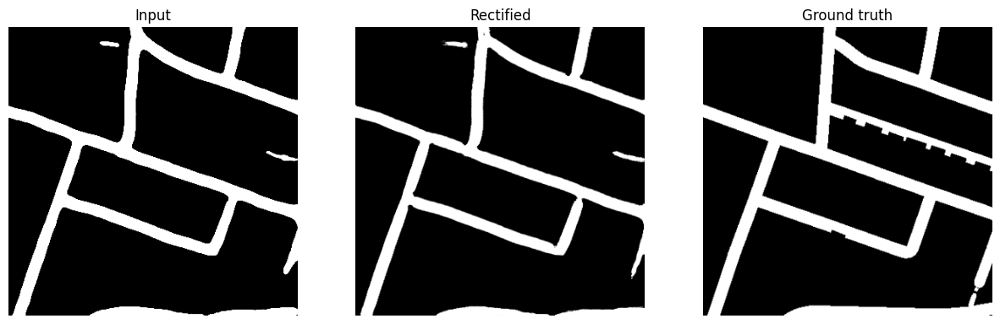

Epoch [30/50] Batch [128/129] Loss D_B: 1.2619 Loss G: 1.7328


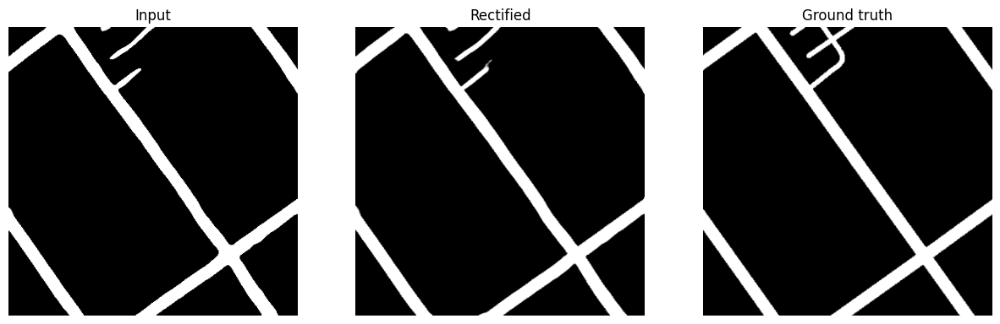

Epoch [31/50] Batch [128/129] Loss D_B: 1.3098 Loss G: 1.8239


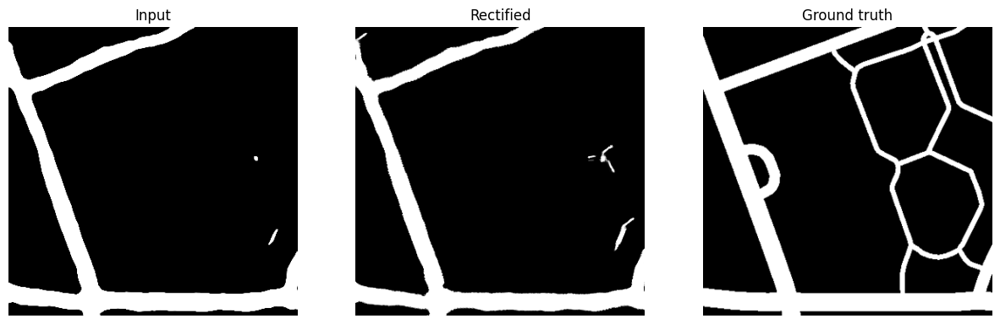

Epoch [32/50] Batch [128/129] Loss D_B: 1.1745 Loss G: 3.0169


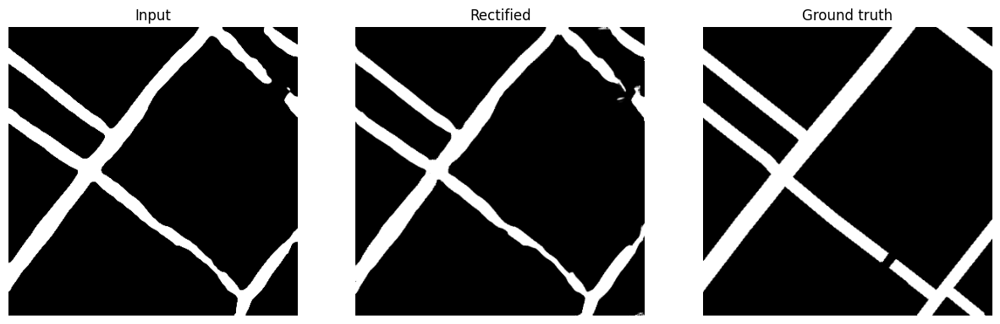

Epoch [33/50] Batch [128/129] Loss D_B: 0.9793 Loss G: 2.3956


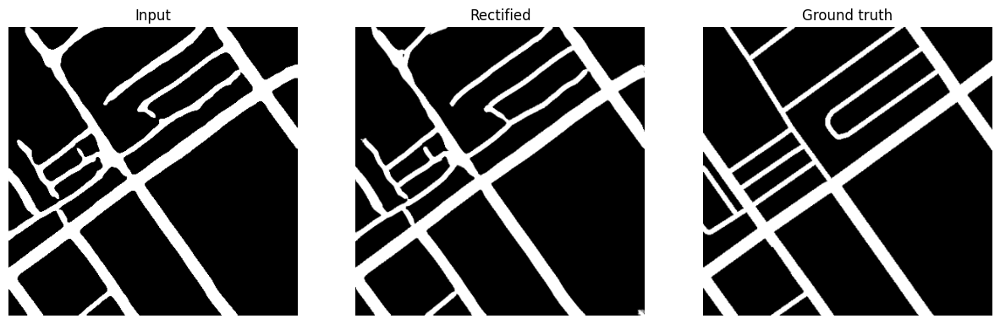

Epoch [34/50] Batch [128/129] Loss D_B: 1.2242 Loss G: 1.9828


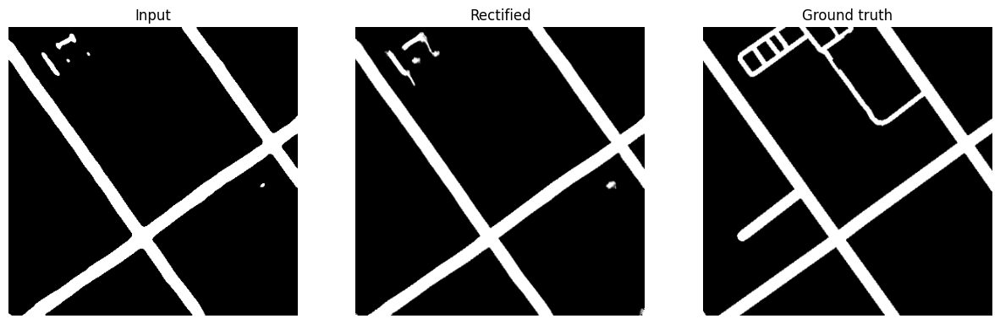

Epoch [35/50] Batch [128/129] Loss D_B: 1.3027 Loss G: 1.9782


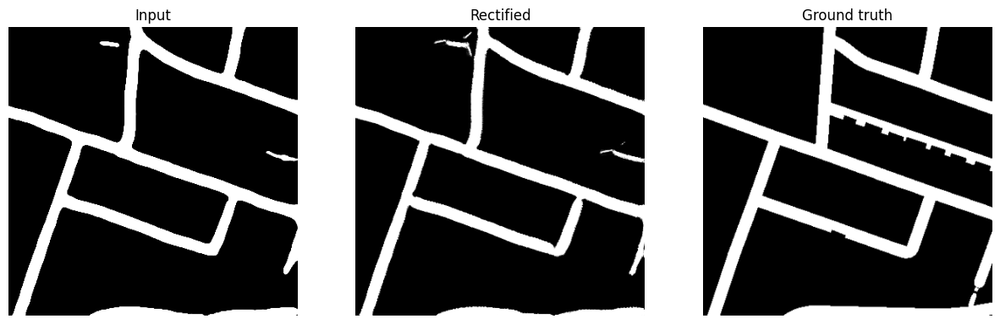

Epoch [36/50] Batch [128/129] Loss D_B: 1.1613 Loss G: 2.3009


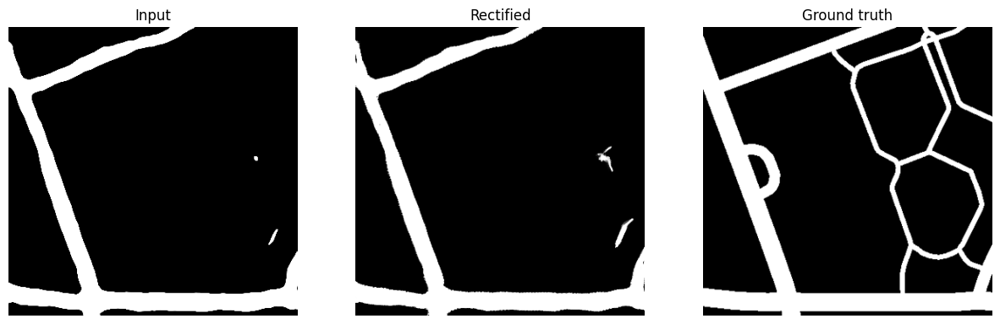

Epoch [37/50] Batch [128/129] Loss D_B: 1.1466 Loss G: 2.4525


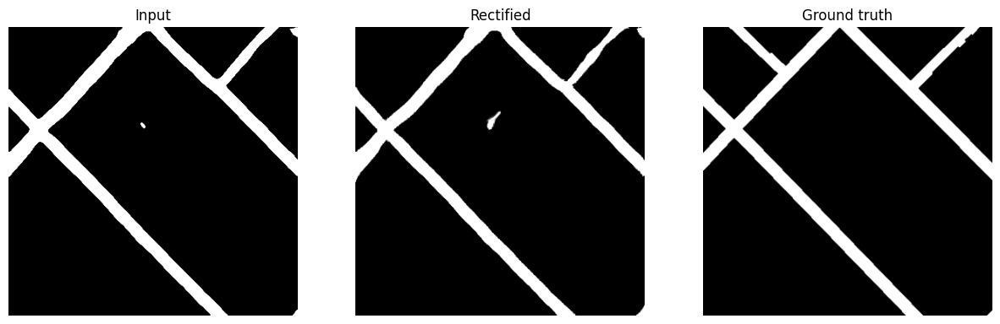

Epoch [38/50] Batch [128/129] Loss D_B: 1.1789 Loss G: 2.5267


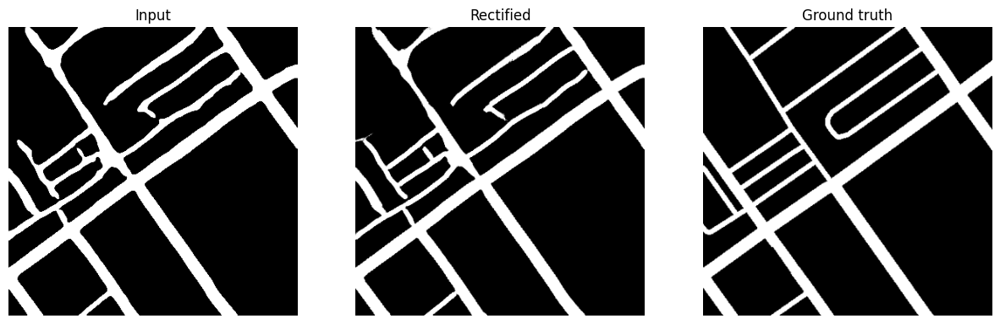

Epoch [39/50] Batch [128/129] Loss D_B: 0.9073 Loss G: 3.8184


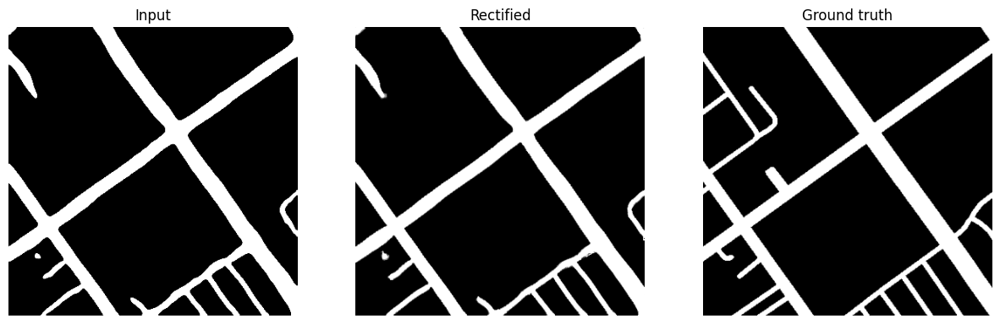

Epoch [40/50] Batch [128/129] Loss D_B: 1.3319 Loss G: 1.8653


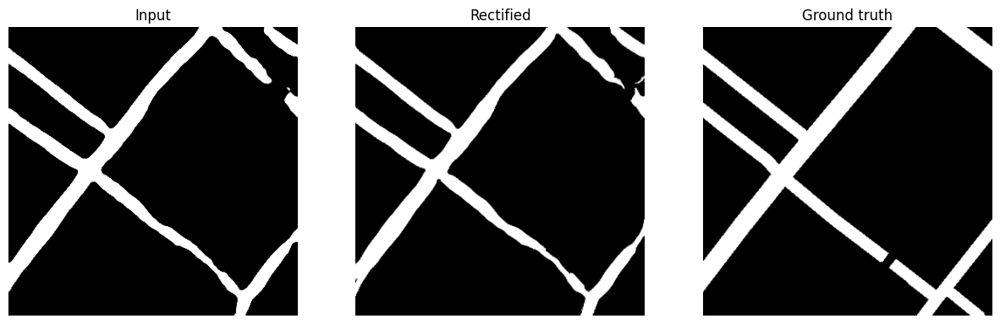

Epoch [41/50] Batch [128/129] Loss D_B: 1.0931 Loss G: 2.4237


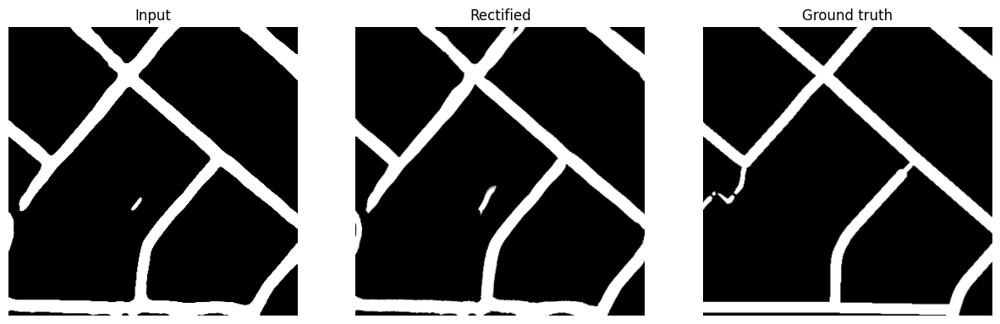

Epoch [42/50] Batch [128/129] Loss D_B: 0.3821 Loss G: 3.4202


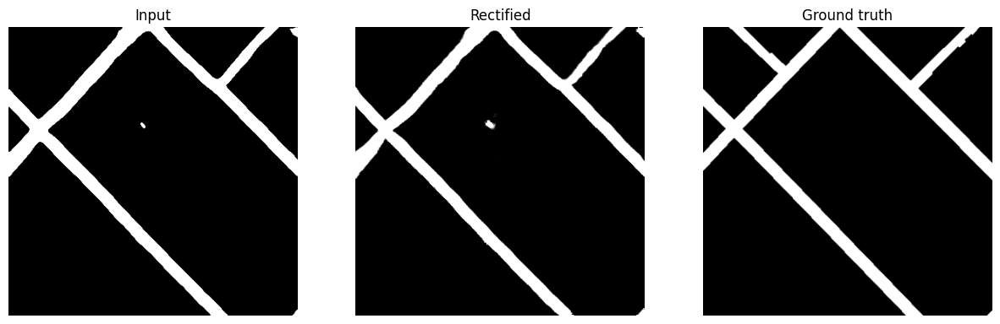

Epoch [43/50] Batch [128/129] Loss D_B: 0.5227 Loss G: 3.3391


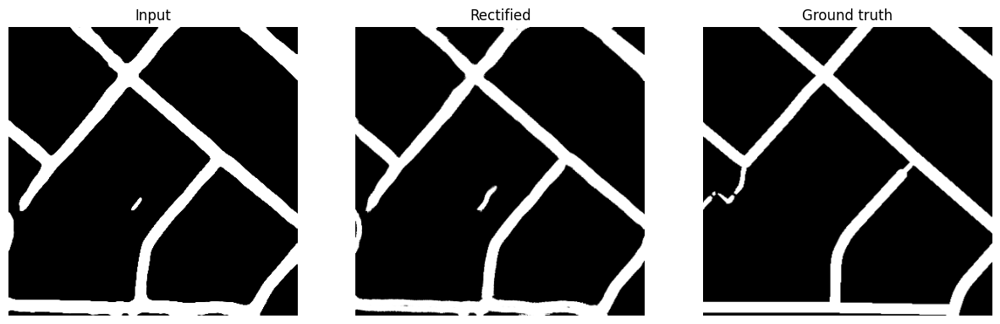

Epoch [44/50] Batch [128/129] Loss D_B: 1.2194 Loss G: 1.9130


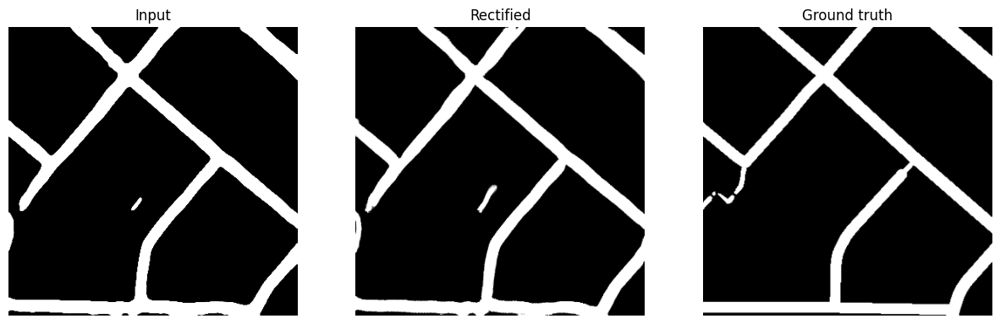

Epoch [45/50] Batch [128/129] Loss D_B: 1.1262 Loss G: 2.4919


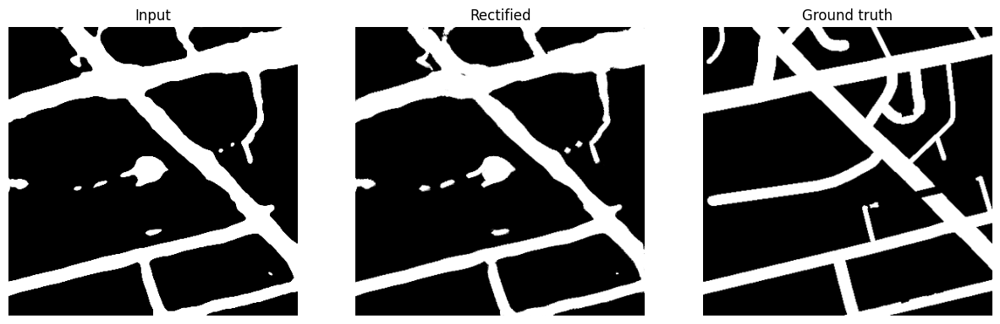

Epoch [46/50] Batch [128/129] Loss D_B: 1.0663 Loss G: 3.1983


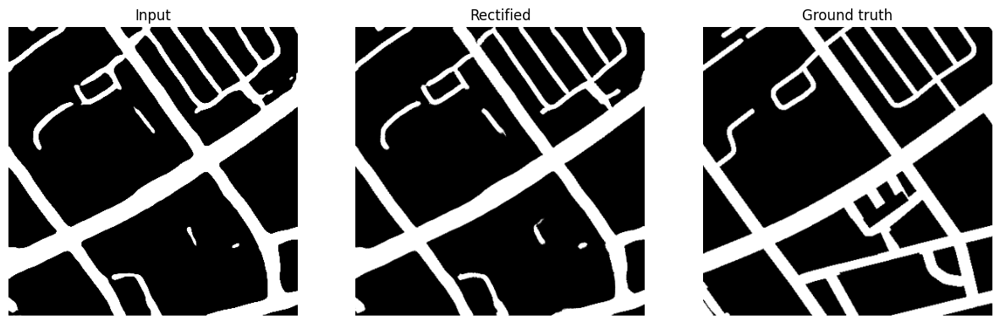

Epoch [47/50] Batch [128/129] Loss D_B: 0.9990 Loss G: 2.7233


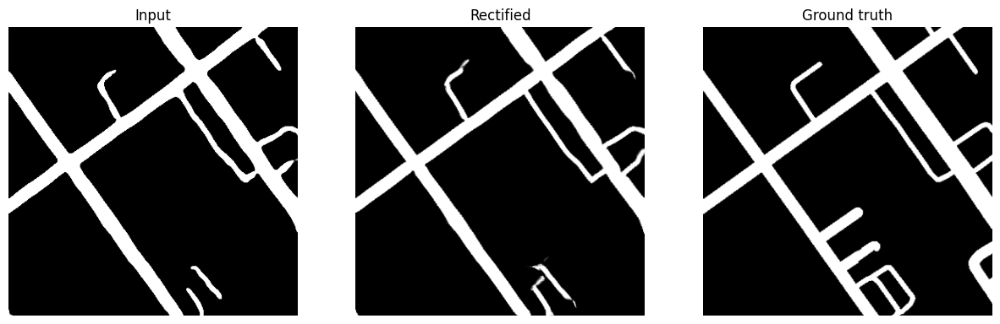

Epoch [48/50] Batch [128/129] Loss D_B: 0.6749 Loss G: 3.4108


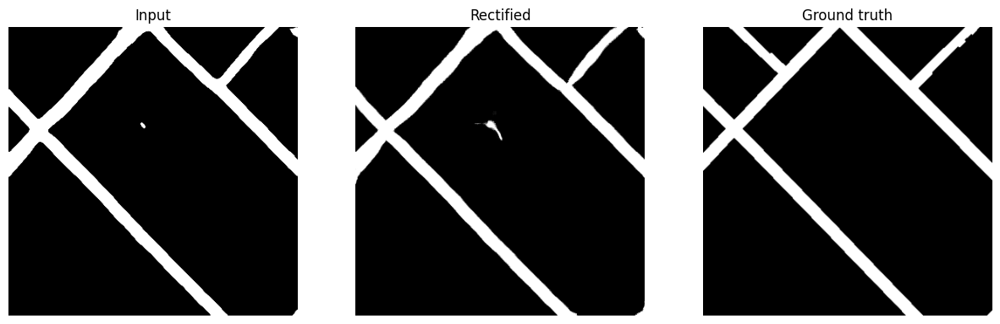

Epoch [49/50] Batch [128/129] Loss D_B: 1.1334 Loss G: 2.5224


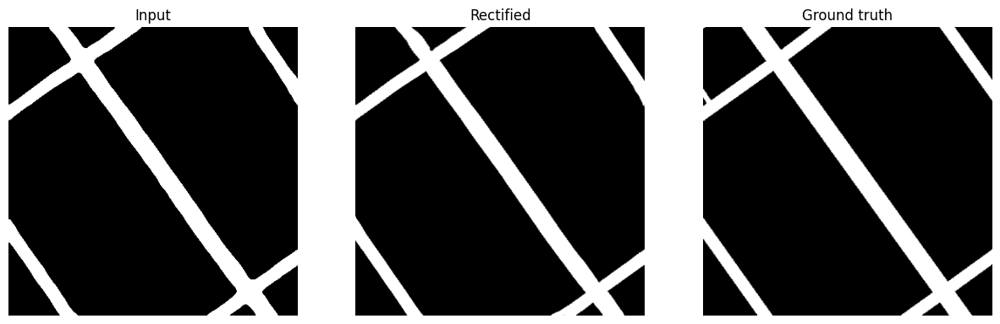

In [ ]:
import itertools
import matplotlib.pyplot as plt

def denormalize(tensor):
    """ Denormalize a tensor from [-1, 1] to [0, 1] """
    return (tensor + 1) / 2

num_epochs = 50
lambda_cycle = 10.0
n_critic = 3  # Number of discriminator updates per generator update

for epoch in range(num_epochs):
    for i, (real_A, real_B, additional_input) in enumerate(dataloader):
        real_A = real_A.to(device)
        real_B = real_B.to(device)
        additional_input = additional_input.to(device)

        # Train Discriminator B
        for _ in range(n_critic):
            optimizer_D_B.zero_grad()

            # Real loss
            pred_real = D_B(real_B)
            loss_D_real_B = criterion_GAN(pred_real, torch.ones_like(pred_real))

            # Fake loss
            x = torch.cat([real_A, additional_input], 1)
            fake_B = G_A2B(x)
            pred_fake = D_B(fake_B.detach())
            loss_D_fake_B = criterion_GAN(pred_fake, torch.zeros_like(pred_fake))

            # Total loss
            loss_D_B = (loss_D_real_B + loss_D_fake_B)
            loss_D_B.backward()
            optimizer_D_B.step()

        # Train Discriminator A
        for _ in range(n_critic):
            optimizer_D_A.zero_grad()

            # Real loss
            pred_real = D_A(real_A)
            loss_D_real_A = criterion_GAN(pred_real, torch.ones_like(pred_real))

            # Fake loss
            x = torch.cat([real_B, additional_input], 1)
            fake_A = G_B2A(x)
            pred_fake = D_A(fake_A.detach())
            loss_D_fake_A = criterion_GAN(pred_fake, torch.zeros_like(pred_fake))

            # Total loss
            loss_D_A = (loss_D_real_A + loss_D_fake_A)
            loss_D_A.backward()
            optimizer_D_A.step()


        # Train Generators
        optimizer_G.zero_grad()

        # GAN loss
        x = torch.cat([real_A, additional_input], 1)
        fake_B = G_A2B(x)
        pred_fake_B = D_B(fake_B)
        loss_GAN_A2B = criterion_GAN(pred_fake_B, torch.ones_like(pred_fake_B))

        x = torch.cat([real_B, additional_input], 1)
        fake_A = G_B2A(x)
        pred_fake_A = D_A(fake_A)
        loss_GAN_B2A = criterion_GAN(pred_fake_A, torch.ones_like(pred_fake_A))

        # cycle loss
        x_A = torch.cat([real_A, additional_input], 1)
        x_B = torch.cat([real_B, additional_input], 1)
        cycle_A = G_B2A(x_B)
        cycle_B = G_A2B(x_A)
        loss_cycle_A = criterion_cycle(cycle_A, real_A)
        loss_cycle_B = criterion_cycle(cycle_B, real_B)

        loss_cycle = loss_cycle_A + loss_cycle_B

        # Total loss
        loss_G = loss_GAN_A2B + loss_GAN_B2A + lambda_cycle * loss_cycle
        loss_G.backward()
        optimizer_G.step()

    print(f"Epoch [{epoch}/{num_epochs}] Batch [{i}/{len(dataloader)}] "
          f"Loss D_B: {loss_D_B.item():.4f} Loss G: {loss_G.item():.4f}")


    with torch.no_grad():
        idx = int(torch.floor(torch.rand(1) * val_images_A.shape[0]))
        val_image = val_images_A[idx].unsqueeze(0).to(device)
        predicted_val_map = predicted_val_maps[idx].unsqueeze(0).unsqueeze(0).to(device)
        val_mask = torch.Tensor(transform(val_masks[idx])).to(device)
        x = torch.cat([predicted_val_map, val_image], 1)
        rectified_val = G_A2B(x)
        # Display images
        plt.figure(figsize=(15, 10))
        plt.subplot(1, 3, 1)
        plt.title("Input")
        # plt.imshow(denormalize(real_A.cpu().detach().numpy().transpose(0, 2, 3, 1)[0]))
        plt.imshow(denormalize(predicted_val_map.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title("Rectified")
        plt.imshow(denormalize(rectified_val.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title("Ground truth")
        plt.imshow(denormalize(val_mask.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.show()

In [ ]:
# prompt: Checkpoint G_Unet

torch.save(G_A2B.state_dict(), '/kaggle/working/sutando_real_cyclegan_GA2B_basemodel.pth')
torch.save(G_B2A.state_dict(), '/kaggle/working/sutando_real_cyclegan_GB2A_basemodel.pth')
torch.save(D_A.state_dict(), '/kaggle/working/sutando_real_cyclegan_DA_basemodel.pth')
torch.save(D_B.state_dict(), '/kaggle/working/sutando_real_cyclegan_DB_basemodel.pth')

In [ ]:
# prompt: Checkpoint G_Unet

torch.save(G_Unet.state_dict(), '/content/drive/MyDrive/G_Unet_mas_dice.pth')
torch.save(D_B.state_dict(), '/content/drive/MyDrive/D_B_mas_dice.pth')

In [ ]:
def create_submission(labels, test_filenames, submission_filename):
    with open(submission_filename, 'w') as f:
        f.write('id,prediction\n')
        for fn, patch_array in zip(sorted(test_filenames), test_pred):
            img_number = int(re.search(r"(\d+)\.png$", fn).group(1))
            for i in range(patch_array.shape[0]):
                for j in range(patch_array.shape[1]):
                    f.write("{:03d}_{}_{},{}\n".format(img_number, j*PATCH_SIZE, i*PATCH_SIZE, int(patch_array[i, j])))
test_path = os.path.join(ROOT_PATH, 'test', 'images')
# predict on test set
test_filenames = (glob(test_path + '/*.png'))
test_images = load_all_from_path(test_path)
batch_size = test_images.shape[0]
size = test_images.shape[1:3]
# we also need to resize the test images. This might not be the best ideas depending on their spatial resolution.
test_images = np.stack([cv2.resize(img, dsize=(384, 384)) for img in test_images], 0)
test_images = test_images[:, :, :, :3]
test_images = np_to_tensor(np.moveaxis(test_images, -1, 1), device)

# predict on test set in batches to avoid OOM error
test_pred = []
batch_size = 16  # Adjust this based on your GPU memory
for i in range(0, test_images.shape[0], batch_size):
    batch = test_images[i:i + batch_size]
    with torch.no_grad():
        batch_pred = model(batch.to(device))
        x = torch.cat([batch_pred, batch], 1)
        batch_pred = G_A2B(x)
    test_pred.append(batch_pred.detach().cpu().numpy())


# test_pred = [model(t) for t in test_images.unsqueeze(1)]
# test_pred = [G_Unet(t).detach().cpu().numpy() for t in test_pred]
test_pred = np.concatenate(test_pred, 0)
test_pred= np.moveaxis(test_pred, 1, -1)  # CHW to HWC
test_pred = np.stack([cv2.resize(img, dsize=size) for img in test_pred], 0)  # resize to original shape
# now compute labels
test_pred = test_pred.reshape((-1, size[0] // PATCH_SIZE, PATCH_SIZE, size[0] // PATCH_SIZE, PATCH_SIZE))
test_pred = np.moveaxis(test_pred, 2, 3)
test_pred = np.round(np.mean(test_pred, (-1, -2)) > CUTOFF)
create_submission(test_pred, test_filenames, submission_filename='eff_unet_sutando_real_cyclegan_basemodel_submission.csv')

### Pix2Pix

In [ ]:
import os
import numpy as np
import torch
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

# Define transformations
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((384, 384)),
    transforms.ToTensor(),
])

# Load datasets
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, predicted_maps, train_masks, train_imgs, transform=None):
        self.predicted_maps = predicted_maps
        self.train_masks = train_masks
        self.train_imgs = train_imgs
        self.transform = transform

    def __len__(self):
        return len(self.predicted_maps)

    def __getitem__(self, idx):
        # concat original image to predicted maps so that the model can have a reference to fill in blank spaces
        # input_imgs = torch.concat((self.predicted_maps[idx].unsqueeze(0), self.train_imgs[idx]), dim=0)
        train_imgs = self.train_imgs[idx]
        input_imgs = self.predicted_maps[idx]
        target_masks = self.train_masks[idx]
        if self.transform:
            input_imgs = self.transform(input_imgs)
            target_masks = self.transform(target_masks)
            train_imgs = self.transform(train_imgs)
        return input_imgs, target_masks, train_imgs

train_images_A = np.stack([cv2.resize(img, dsize=(384, 384)) for img in train_images], 0)
train_images_A = train_images_A[:, :, :, :3]
train_images_A = np_to_tensor(np.moveaxis(train_images_A, -1, 1), device)
predicted_maps = torch.Tensor([model(t).detach().cpu().numpy() for t in train_images_A.unsqueeze(1)]).squeeze(2).squeeze(1)
dataset = CustomDataset(predicted_maps, train_masks, train_images_A.detach().cpu(), transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

val_images_A = np.stack([cv2.resize(img, dsize=(384, 384)) for img in val_images], 0)
val_images_A = val_images_A[:, :, :, :3]
val_images_A = np_to_tensor(np.moveaxis(val_images_A, -1, 1), device)
predicted_val_maps = torch.Tensor([model(t).detach().cpu().numpy() for t in val_images_A.unsqueeze(1)]).squeeze(2).squeeze(1)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Generator Unet
class UNetBlock(nn.Module):
    def __init__(self, in_channels, out_channels, inner_block=None, is_outermost=False, is_innermost=False):
        super(UNetBlock, self).__init__()
        self.is_outermost = is_outermost
        self.is_innermost = is_innermost

        downconv = nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.InstanceNorm2d(out_channels)

        upconv = nn.ConvTranspose2d(out_channels * 2, in_channels, kernel_size=4, stride=2, padding=1)
        uprelu = nn.ReLU(True)
        upnorm = nn.InstanceNorm2d(in_channels)

        if is_outermost:
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            self.model = nn.Sequential(*down, inner_block, *up)
        elif is_innermost:
            upconv = nn.ConvTranspose2d(out_channels, in_channels, kernel_size=4, stride=2, padding=1)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            self.model = nn.Sequential(*down, *up)
        else:
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            self.model = nn.Sequential(*down, inner_block, *up)

    def forward(self, x):
        if self.is_outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Generator(nn.Module):
    def __init__(self, input_nc, output_nc, num_downs):
        super(Generator, self).__init__()
        unet_block = UNetBlock(512, 512, is_innermost=True)
        for _ in range(num_downs - 5):
            unet_block = UNetBlock(512, 512, inner_block=unet_block)
        unet_block = UNetBlock(256, 512, inner_block=unet_block)
        unet_block = UNetBlock(128, 256, inner_block=unet_block)
        unet_block = UNetBlock(64, 128, inner_block=unet_block)
        self.model = UNetBlock(input_nc, 64, inner_block=unet_block, is_outermost=True)

    def forward(self, noise, input):
        x = torch.cat([noise, input], 1)
        return self.model(x)


# PatchGAN Discriminator
class PatchGANDiscriminator(nn.Module):
    def __init__(self, in_channels=3, ch=64):
        super(PatchGANDiscriminator, self).__init__()

        self.conv1 = nn.Conv2d(in_channels, ch, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(ch, ch * 2, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(ch * 2, ch * 4, kernel_size=4, stride=2, padding=1)
        self.conv4 = nn.Conv2d(ch * 4, ch * 8, kernel_size=4, stride=1, padding=1)
        self.conv5 = nn.Conv2d(ch * 8, 1, kernel_size=4, stride=1, padding=1)

        self.bn2 = nn.BatchNorm2d(ch * 2)
        self.bn3 = nn.BatchNorm2d(ch * 4)
        self.bn4 = nn.BatchNorm2d(ch * 8)

    def forward(self, x, y):
        x = torch.cat([x, y], 1)
        x = F.leaky_relu(self.conv1(x), 0.2, inplace=True)
        x = F.leaky_relu(self.bn2(self.conv2(x)), 0.2, inplace=True)
        x = F.leaky_relu(self.bn3(self.conv3(x)), 0.2, inplace=True)
        x = F.leaky_relu(self.bn4(self.conv4(x)), 0.2, inplace=True)
        x = torch.sigmoid(self.conv5(x))
        return x


generator = smp.UnetPlusPlus(
              encoder_name=ENCODER,
              encoder_weights=ENCODER_WEIGHTS,
              in_channels=5,
              classes=1,
              activation='sigmoid',
          ).to(device)
discriminator = PatchGANDiscriminator(in_channels=2, ch=PATCH_SIZE).to(device)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [ ]:
criterion_cGAN = nn.BCELoss()
criterion_low_freq = nn.L1Loss()

lambda_low_freq = 1000

Epoch [0/50] Batch [128/129] Loss D: 0.6579 Loss G: 5.4393


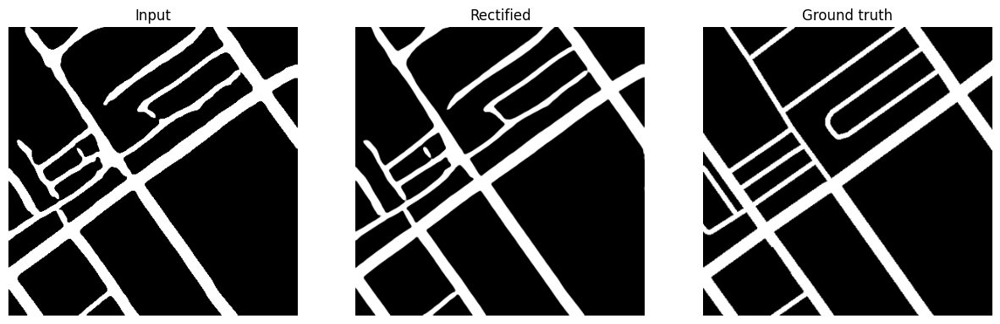

Epoch [1/50] Batch [128/129] Loss D: 0.8072 Loss G: 3.5962


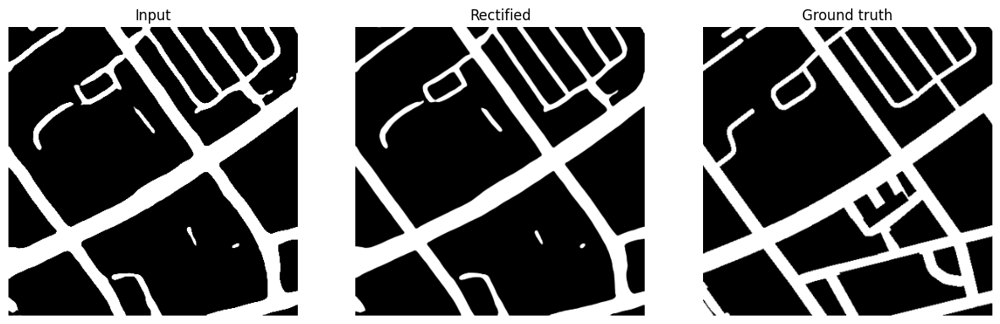

Epoch [2/50] Batch [128/129] Loss D: 0.7264 Loss G: 10.2464


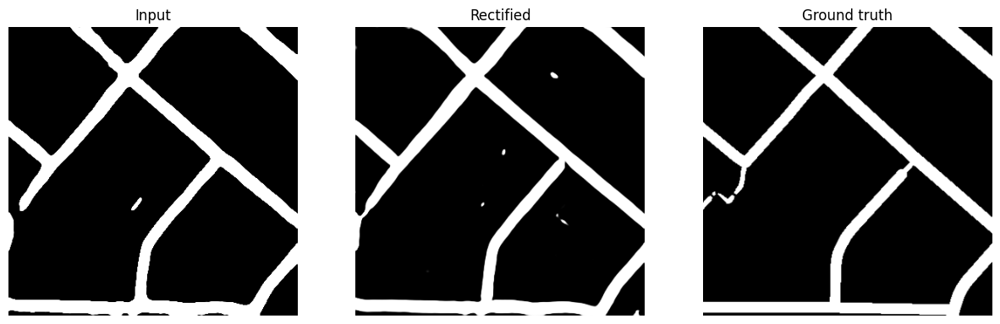

Epoch [3/50] Batch [128/129] Loss D: 0.3680 Loss G: 19.9248


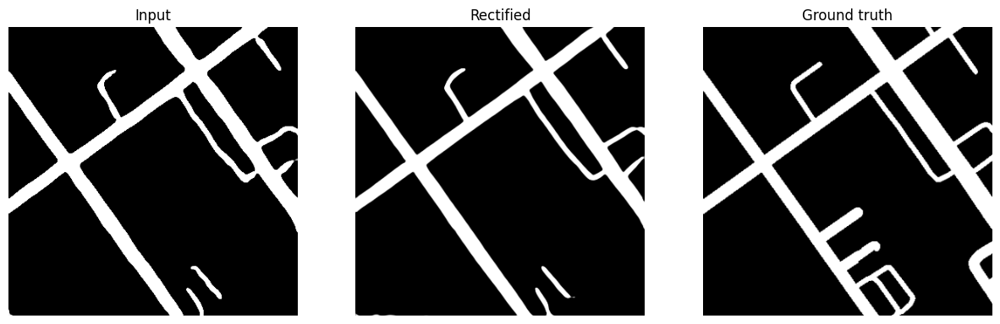

Epoch [4/50] Batch [128/129] Loss D: 0.7987 Loss G: 3.9299


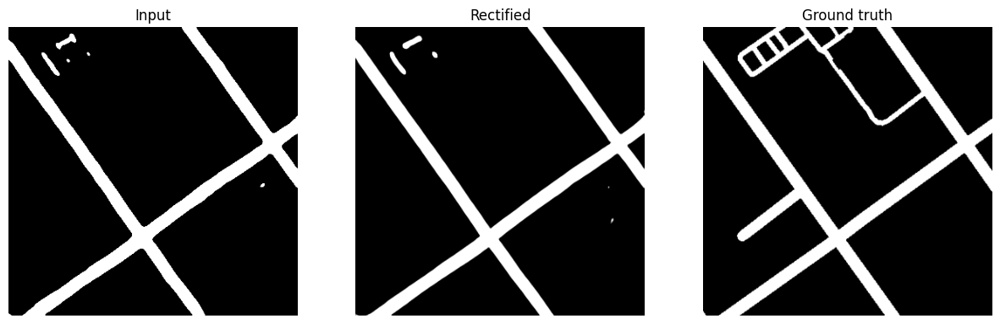

Epoch [5/50] Batch [128/129] Loss D: 0.7693 Loss G: 5.6312


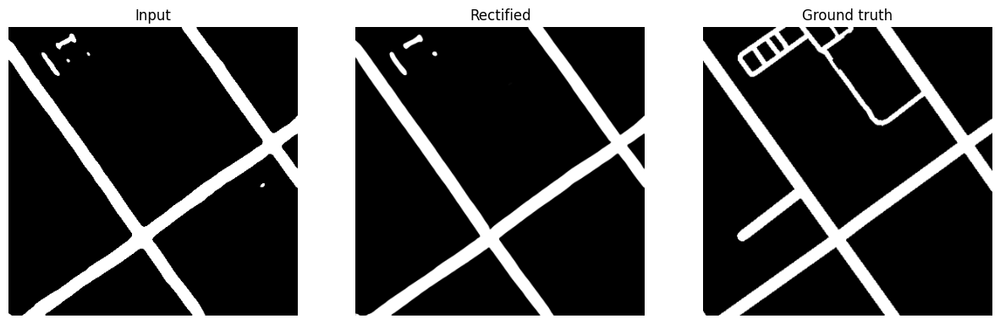

Epoch [6/50] Batch [128/129] Loss D: 0.7093 Loss G: 4.8378


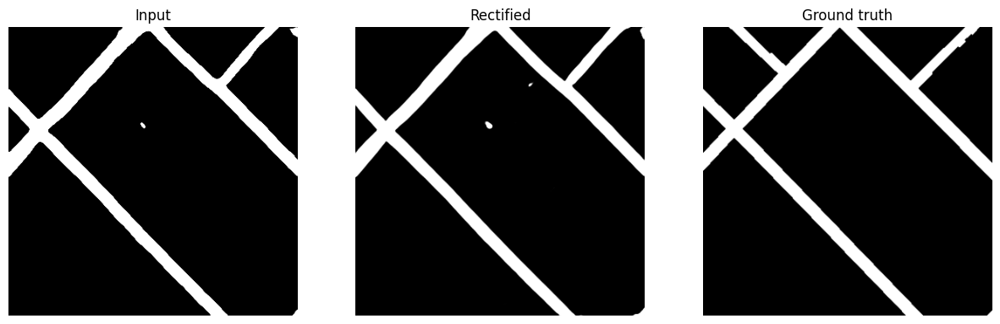

Epoch [7/50] Batch [128/129] Loss D: 0.1375 Loss G: 12.3026


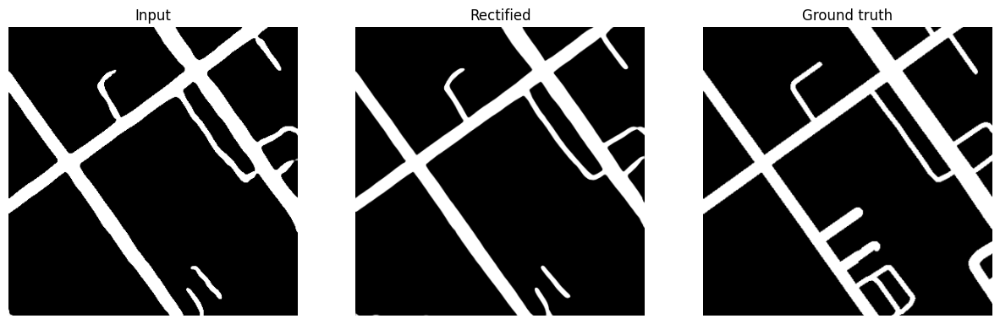

Epoch [8/50] Batch [128/129] Loss D: 0.6450 Loss G: 7.4188


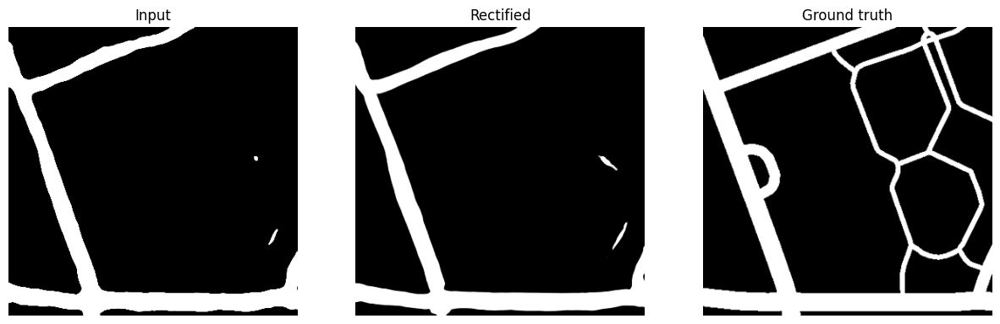

Epoch [9/50] Batch [128/129] Loss D: 0.2233 Loss G: 11.2344


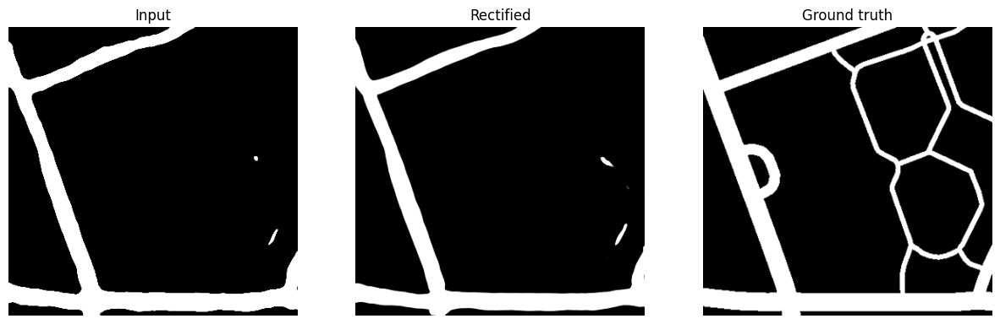

Epoch [10/50] Batch [128/129] Loss D: 0.3644 Loss G: 6.6456


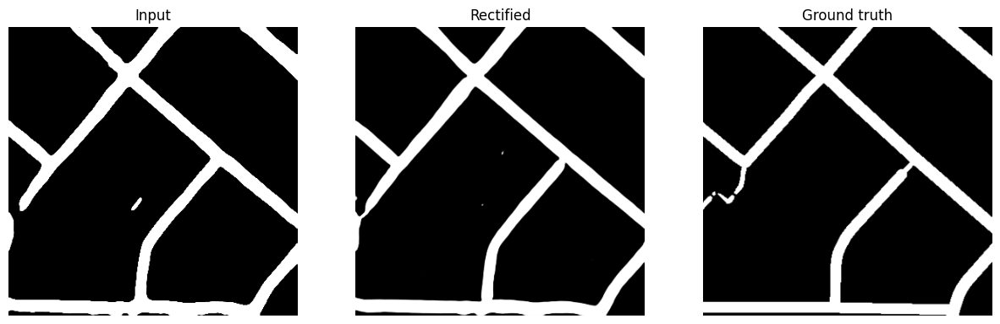

Epoch [11/50] Batch [128/129] Loss D: 0.7174 Loss G: 9.5697


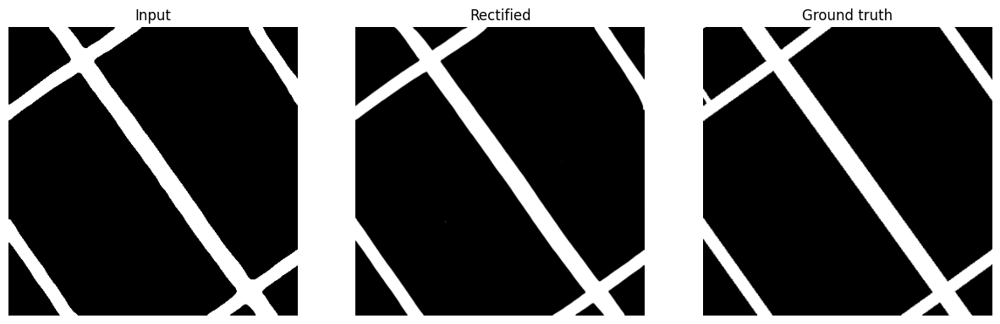

Epoch [12/50] Batch [128/129] Loss D: 0.4701 Loss G: 11.8759


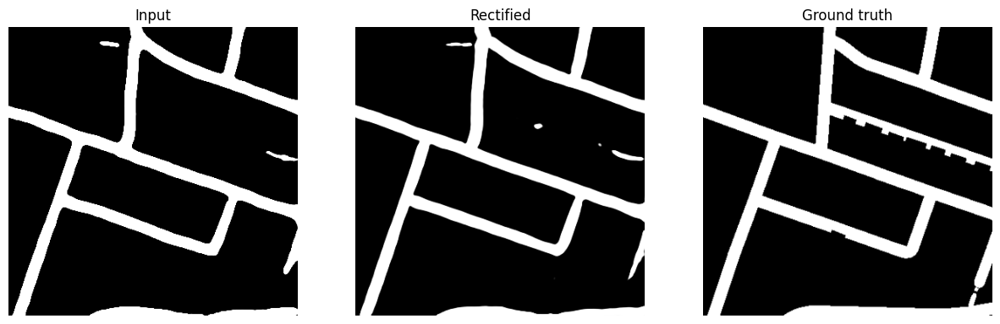

Epoch [13/50] Batch [128/129] Loss D: 0.8058 Loss G: 5.5868


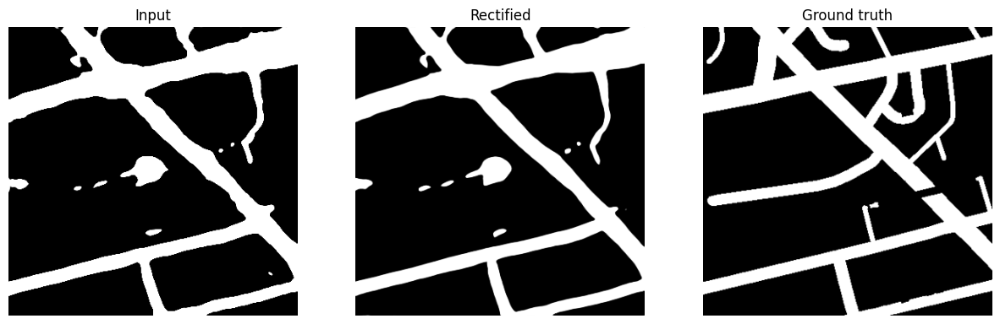

Epoch [14/50] Batch [128/129] Loss D: 0.4189 Loss G: 11.5677


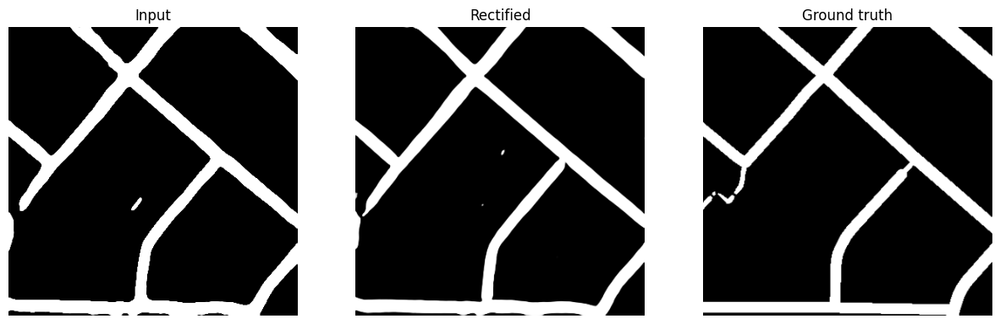

Epoch [15/50] Batch [128/129] Loss D: 0.9280 Loss G: 6.2937


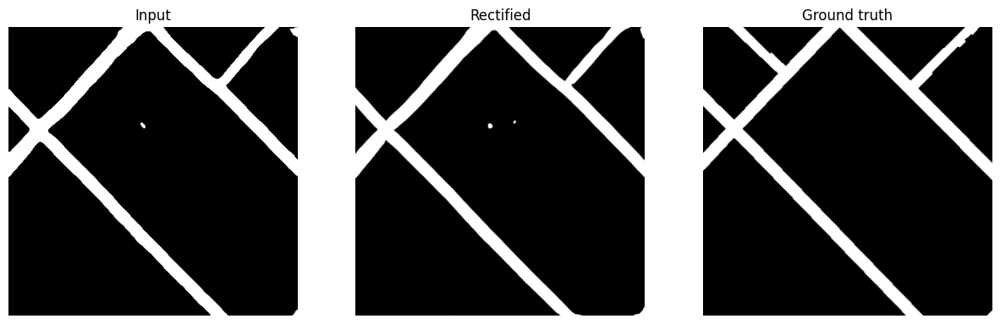

Epoch [16/50] Batch [128/129] Loss D: 0.5812 Loss G: 12.8667


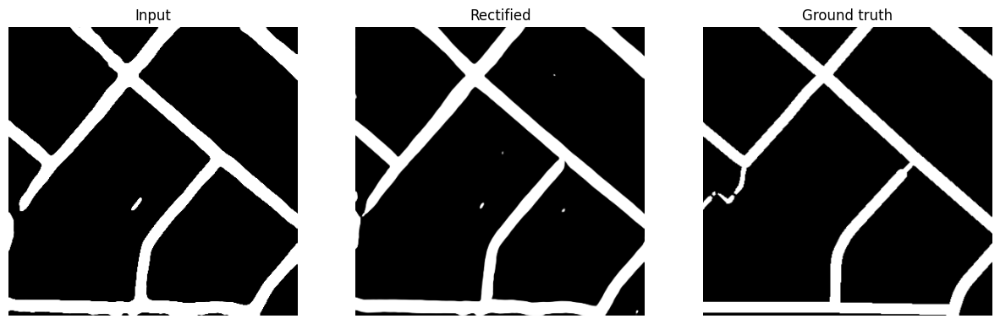

Epoch [17/50] Batch [128/129] Loss D: 0.7011 Loss G: 6.9108


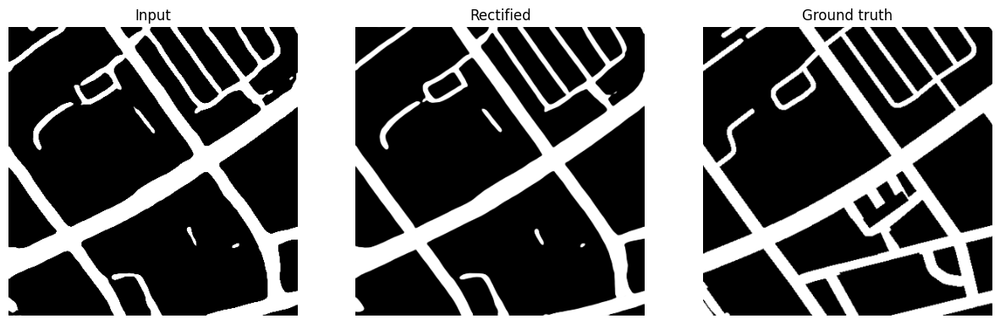

Epoch [18/50] Batch [128/129] Loss D: 0.5334 Loss G: 9.1499


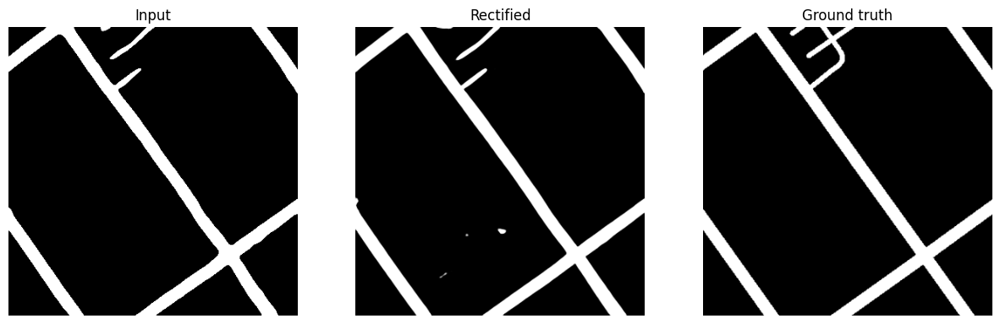

Epoch [19/50] Batch [128/129] Loss D: 0.7275 Loss G: 5.5793


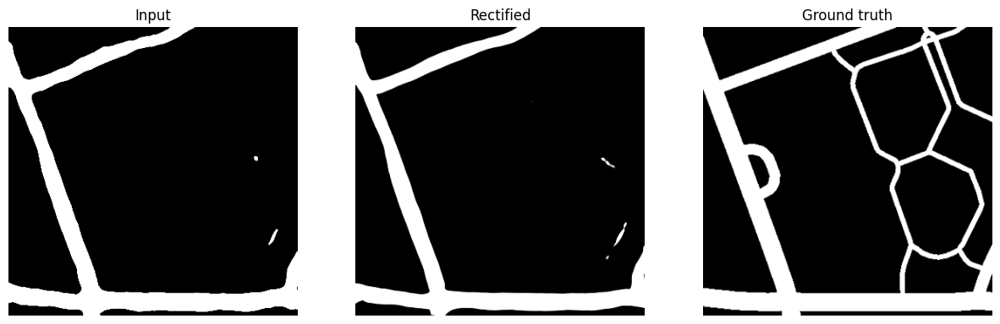

Epoch [20/50] Batch [128/129] Loss D: 0.7577 Loss G: 3.9664


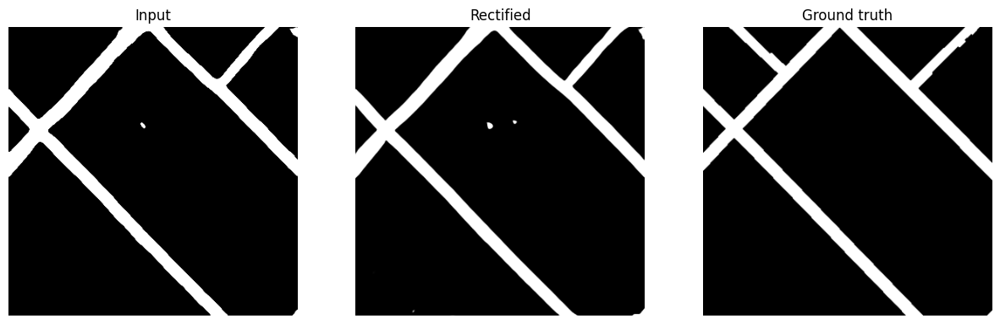

Epoch [21/50] Batch [128/129] Loss D: 0.7261 Loss G: 6.2422


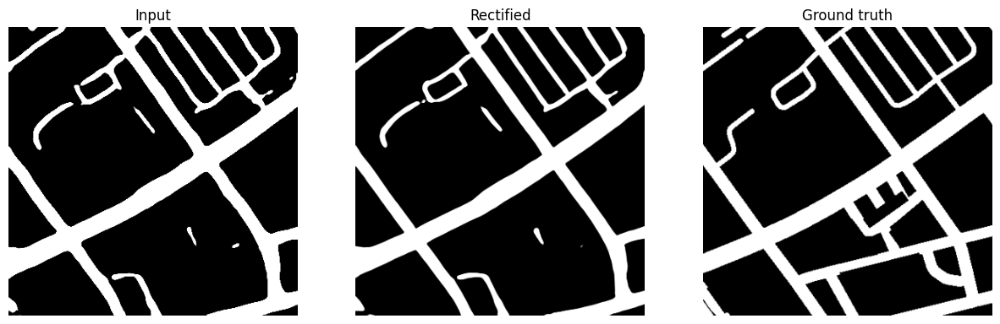

Epoch [22/50] Batch [128/129] Loss D: 0.8598 Loss G: 6.2962


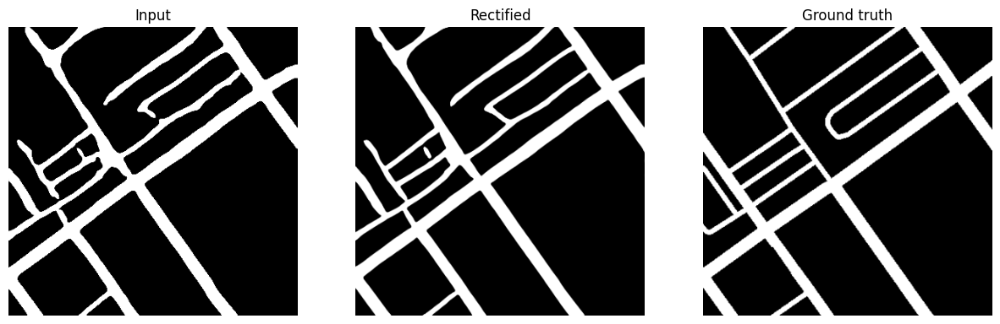

Epoch [23/50] Batch [128/129] Loss D: 0.2187 Loss G: 18.8708


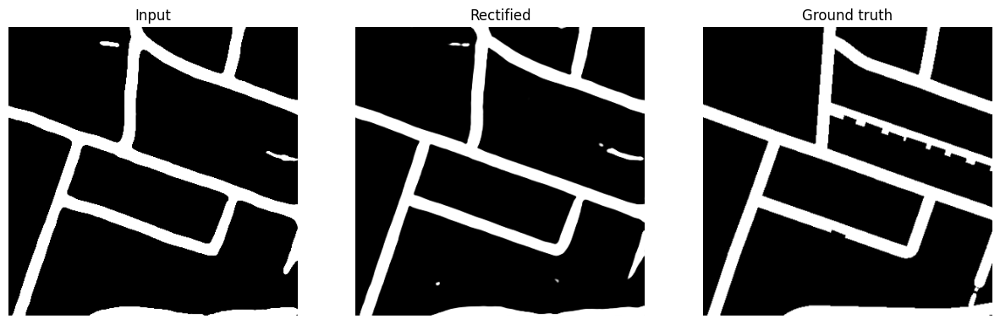

Epoch [24/50] Batch [128/129] Loss D: 0.7092 Loss G: 3.4490


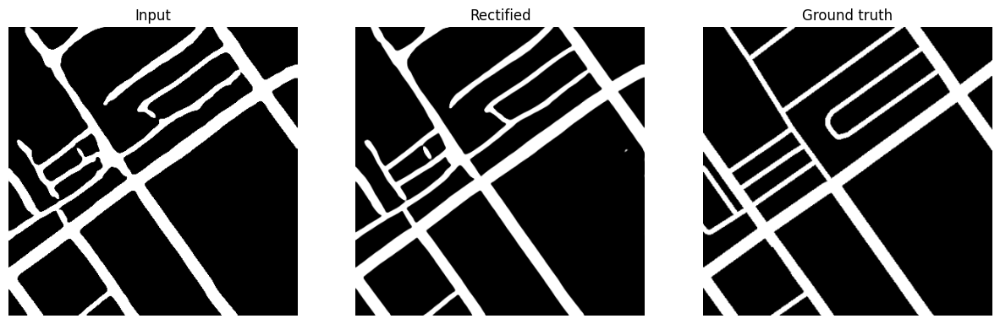

Epoch [25/50] Batch [128/129] Loss D: 0.7888 Loss G: 7.4077


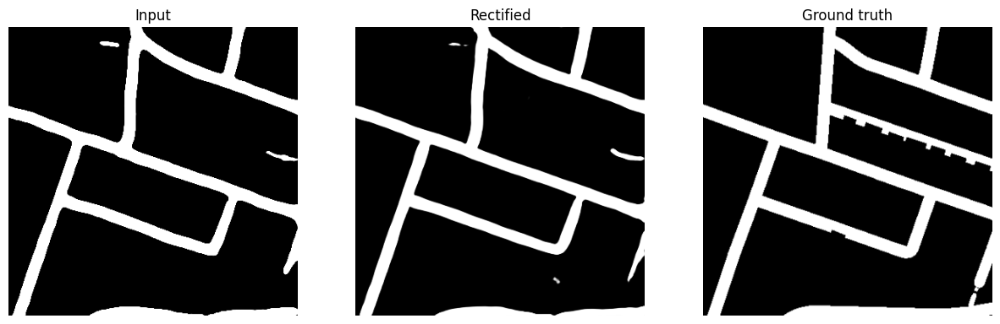

Epoch [26/50] Batch [128/129] Loss D: 0.6110 Loss G: 8.6593


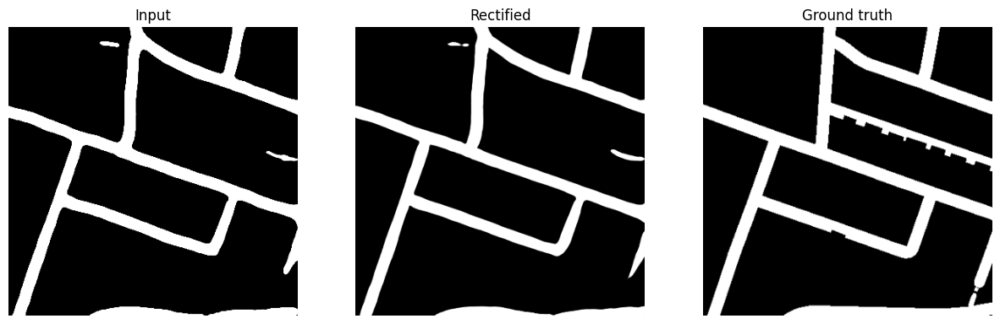

Epoch [27/50] Batch [128/129] Loss D: 0.4708 Loss G: 25.8547


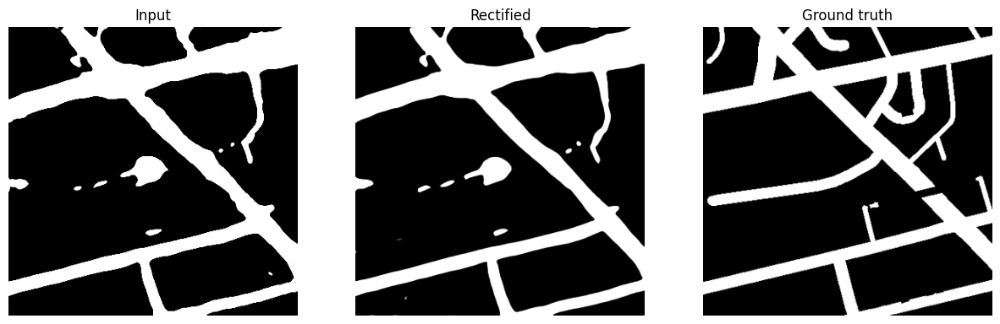

Epoch [28/50] Batch [128/129] Loss D: 0.7185 Loss G: 3.7547


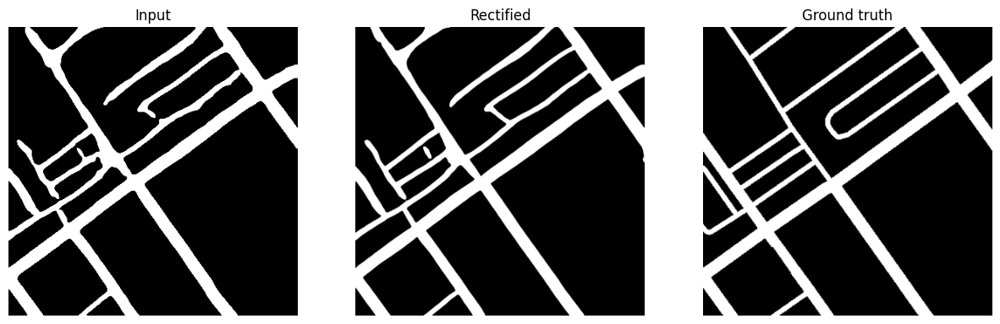

Epoch [29/50] Batch [128/129] Loss D: 0.6274 Loss G: 5.3069


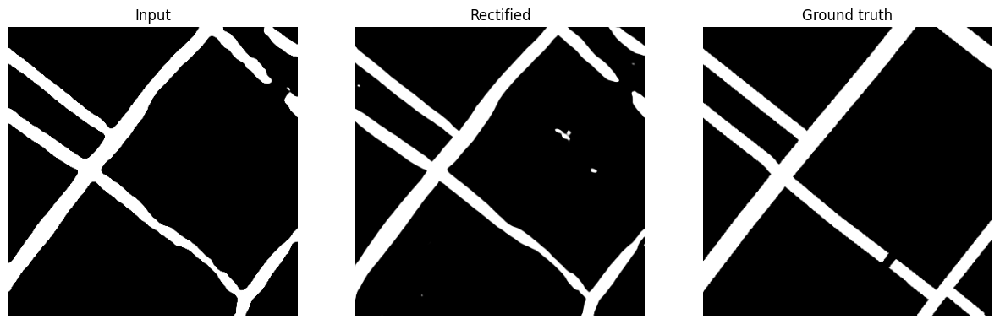

Epoch [30/50] Batch [128/129] Loss D: 0.2777 Loss G: 9.4302


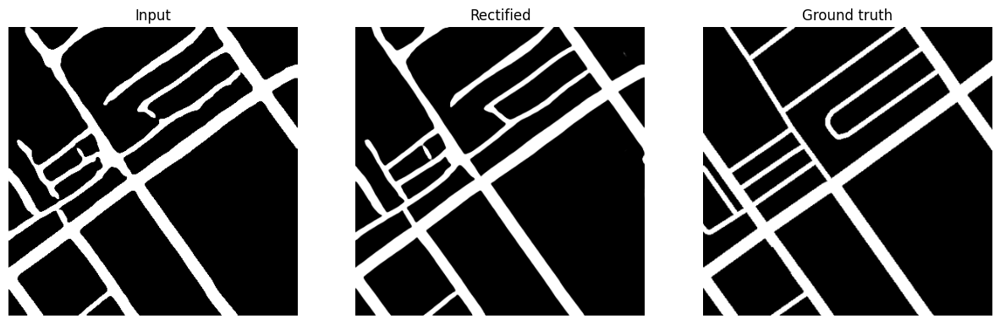

Epoch [31/50] Batch [128/129] Loss D: 0.3703 Loss G: 12.3008


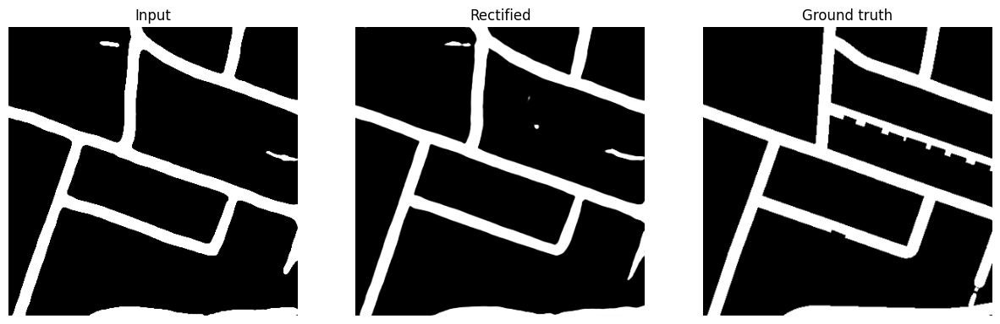

Epoch [32/50] Batch [128/129] Loss D: 0.1627 Loss G: 11.4565


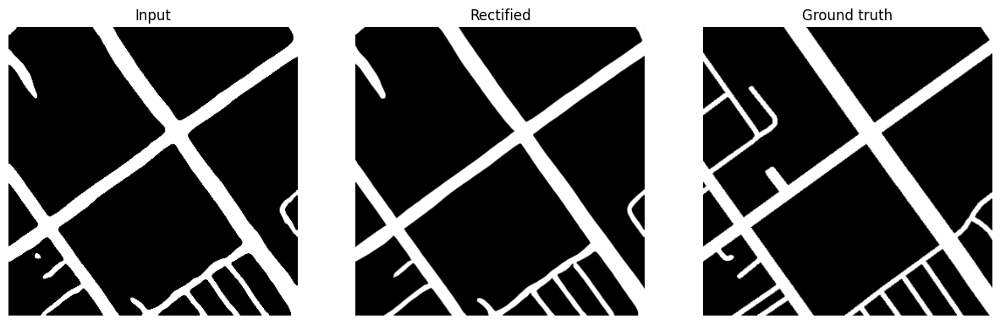

Epoch [33/50] Batch [128/129] Loss D: 0.6422 Loss G: 6.2817


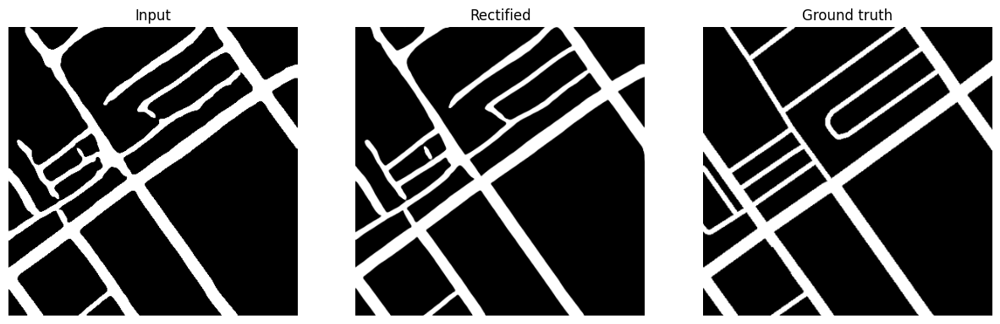

Epoch [34/50] Batch [128/129] Loss D: 0.4653 Loss G: 21.4078


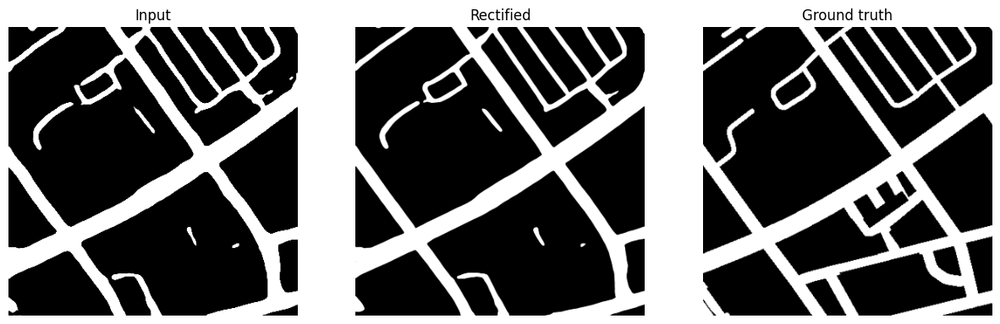

Epoch [35/50] Batch [128/129] Loss D: 0.6678 Loss G: 3.6124


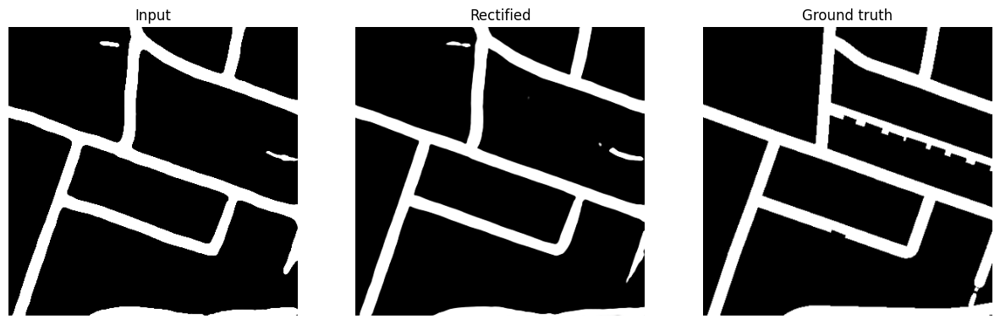

Epoch [36/50] Batch [128/129] Loss D: 0.1561 Loss G: 23.5761


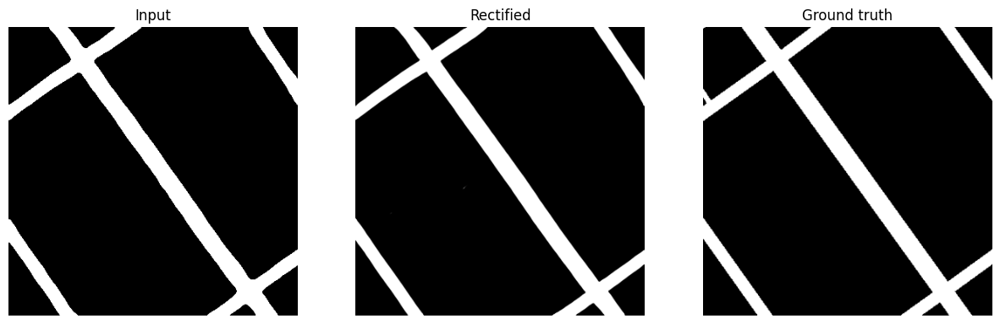

Epoch [37/50] Batch [128/129] Loss D: 0.2454 Loss G: 9.2890


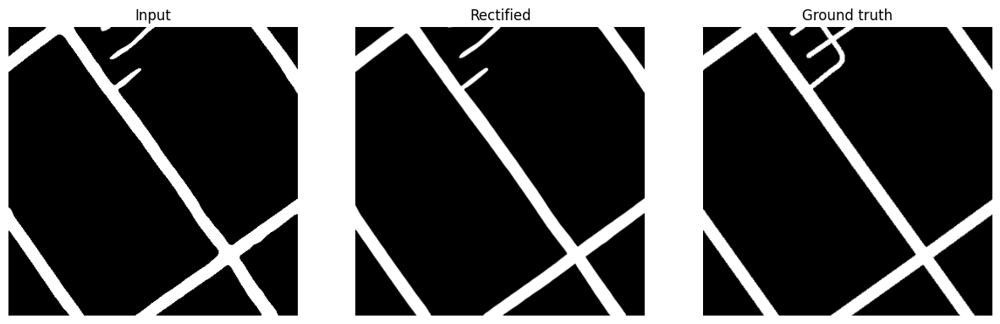

Epoch [38/50] Batch [128/129] Loss D: 0.6485 Loss G: 5.2146


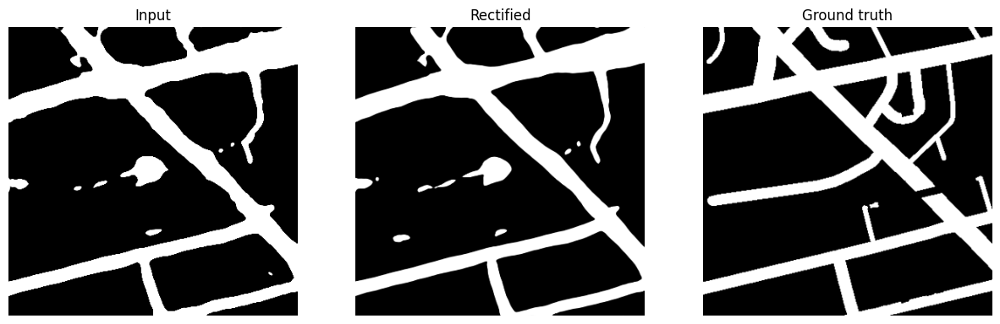

Epoch [39/50] Batch [128/129] Loss D: 0.7486 Loss G: 3.4530


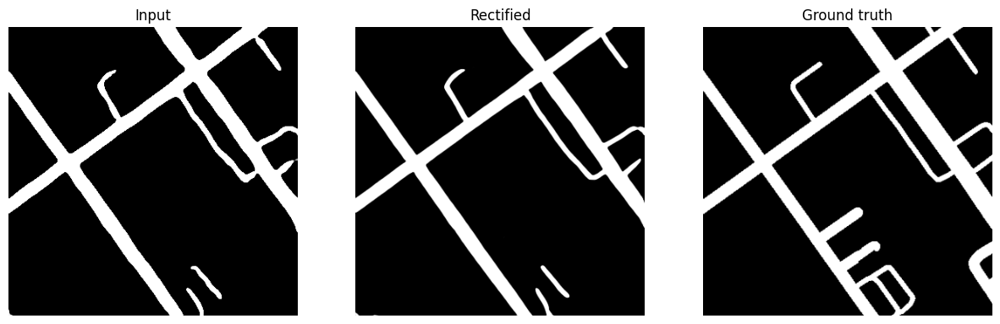

Epoch [40/50] Batch [128/129] Loss D: 0.7225 Loss G: 4.5780


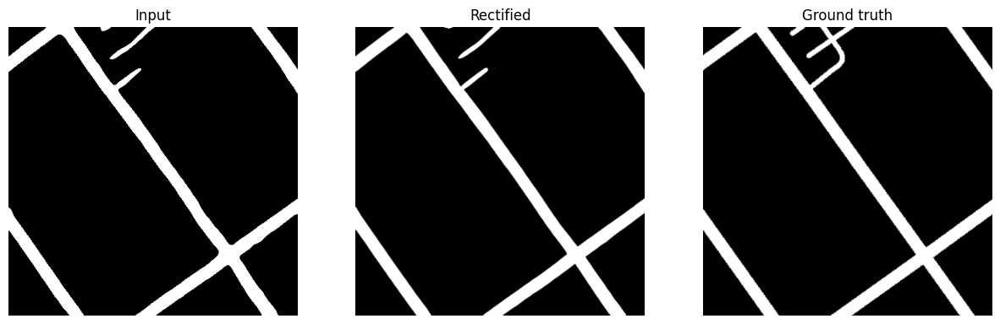

Epoch [41/50] Batch [128/129] Loss D: 0.5975 Loss G: 10.2082


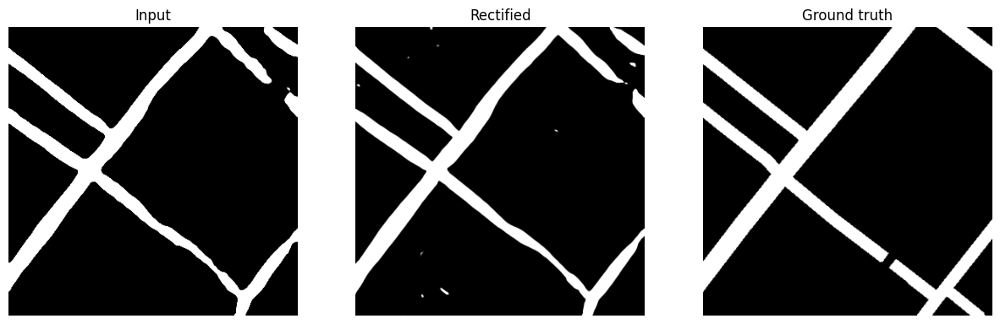

Epoch [42/50] Batch [128/129] Loss D: 0.7415 Loss G: 7.0569


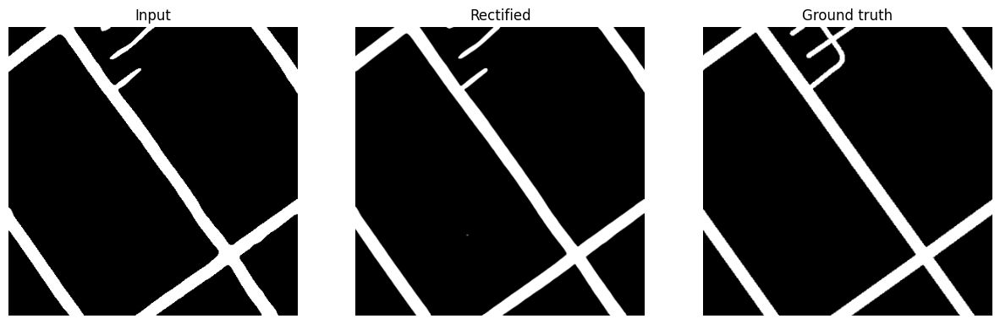

Epoch [43/50] Batch [128/129] Loss D: 0.8192 Loss G: 5.0868


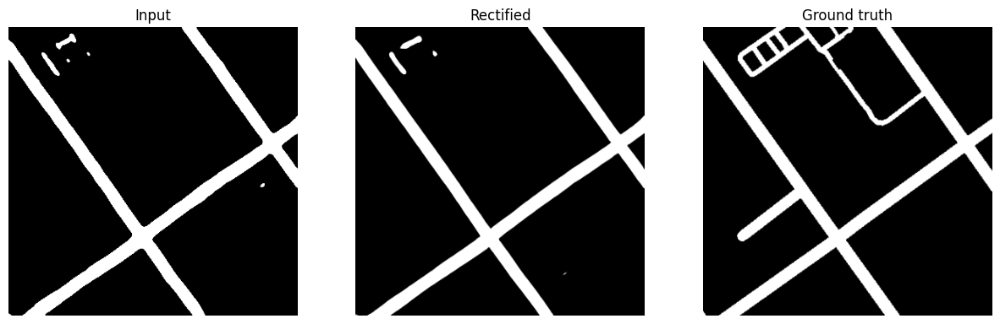

Epoch [44/50] Batch [128/129] Loss D: 0.2553 Loss G: 13.7135


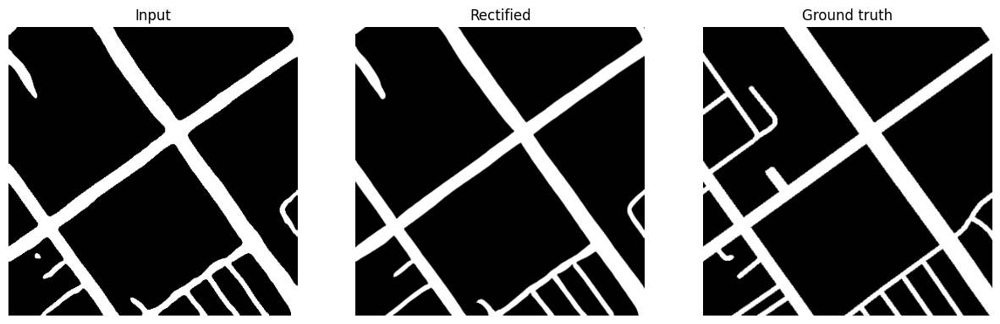

Epoch [45/50] Batch [128/129] Loss D: 0.3600 Loss G: 14.5292


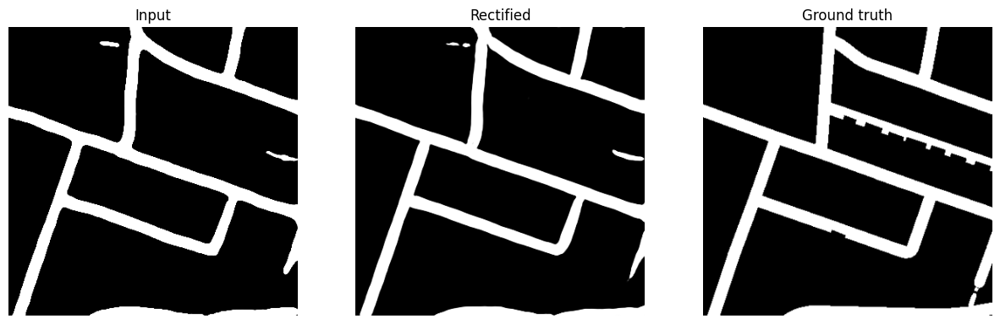

Epoch [46/50] Batch [128/129] Loss D: 0.7247 Loss G: 8.5257


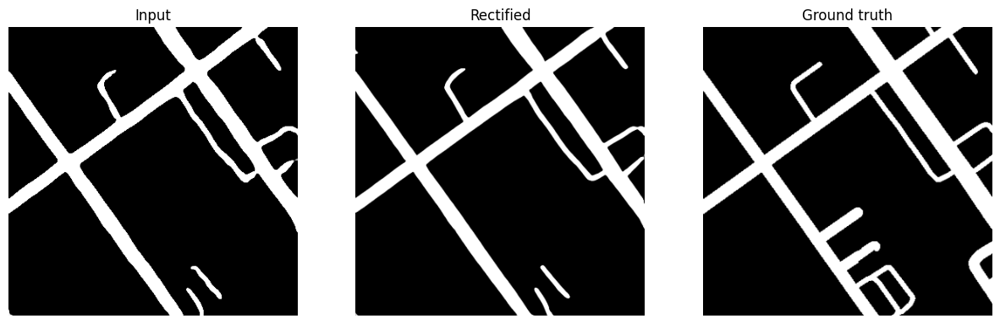

Epoch [47/50] Batch [128/129] Loss D: 0.2421 Loss G: 31.2636


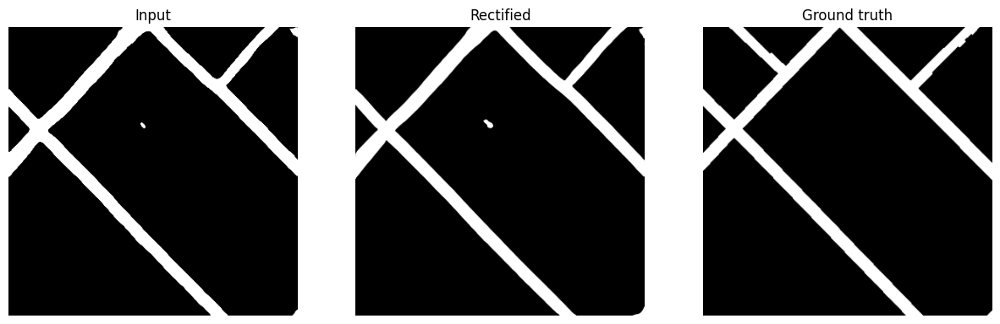

Epoch [48/50] Batch [128/129] Loss D: 0.6180 Loss G: 3.4979


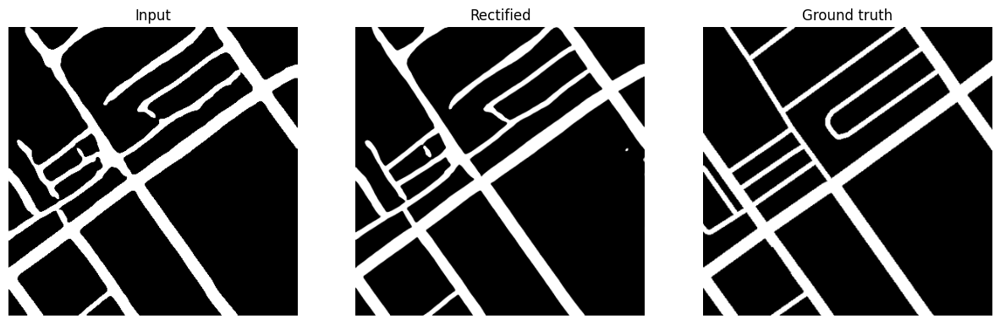

Epoch [49/50] Batch [128/129] Loss D: 0.7015 Loss G: 5.4781


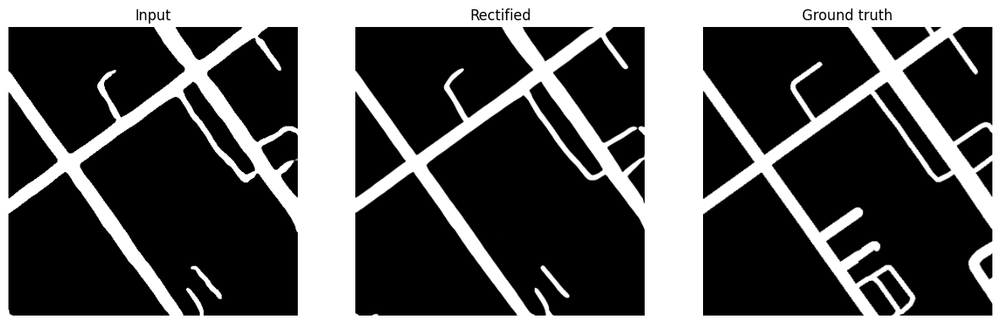

In [ ]:
import itertools
import matplotlib.pyplot as plt

def denormalize(tensor):
    """ Denormalize a tensor from [-1, 1] to [0, 1] """
    return (tensor + 1) / 2

num_epochs = 50
n_critic = 1  # Number of discriminator updates per generator update

for epoch in range(num_epochs):
    for i, (real_A, real_B, additional_input) in enumerate(dataloader):
        real_A = real_A.to(device)
        real_B = real_B.to(device)
        additional_input = additional_input.to(device)

        # Train Discriminator
        for _ in range(n_critic):
            optimizer_D.zero_grad()

            # Real loss
            pred_real = discriminator(real_A, real_B)
            loss_D_real = criterion_cGAN(pred_real, torch.ones_like(pred_real))

            # Fake loss
            z = torch.randn_like(real_A).to(device)
            x = torch.cat([z, real_A, additional_input], 1)
            fake_B = generator(x)
            pred_fake = discriminator(real_A, fake_B.detach())
            loss_D_fake = criterion_cGAN(pred_fake, torch.zeros_like(pred_fake))

            # Total loss
            loss_D = (loss_D_real + loss_D_fake) * 0.5
            loss_D.backward()
            optimizer_D.step()

        # Train Generator
        optimizer_G.zero_grad()

        # GAN loss
        z = torch.randn_like(real_A).to(device)
        x = torch.cat([z, real_A, additional_input], 1)
        fake_B = generator(x)
        pred_fake = discriminator(real_A, fake_B)
        loss_GAN = criterion_cGAN(pred_fake, torch.ones_like(pred_fake))

        # L1 loss
        loss_low_freq = criterion_low_freq(fake_B, real_B)

        # Total loss
        loss_G = loss_GAN + loss_low_freq * lambda_low_freq

        loss_G.backward()
        optimizer_G.step()

    print(f"Epoch [{epoch}/{num_epochs}] Batch [{i}/{len(dataloader)}] "
          f"Loss D: {loss_D.item():.4f} Loss G: {loss_G.item():.4f}")


    with torch.no_grad():
        idx = int(torch.floor(torch.rand(1) * val_images_A.shape[0]))
        val_image = val_images_A[idx].to(device)
        predicted_val_mask = predicted_val_maps[idx].unsqueeze(0).to(device)
        val_mask = torch.Tensor(transform(val_masks[idx])).unsqueeze(0).to(device)
        # conditioned_val_mask = torch.concat((predicted_val_mask, val_image), dim=0)
        z = torch.randn_like(predicted_val_mask).to(device)
        x = torch.cat([z, predicted_val_mask, val_image], 0)
        rectified_val = generator(x.unsqueeze(0))
        # Display images
        plt.figure(figsize=(15, 10))
        plt.subplot(1, 3, 1)
        plt.title("Input")
        # plt.imshow(denormalize(real_A.cpu().detach().numpy().transpose(0, 2, 3, 1)[0]))
        plt.imshow(denormalize(predicted_val_mask.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.title("Rectified")
        plt.imshow(denormalize(rectified_val.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title("Ground truth")
        plt.imshow(denormalize(val_mask.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.show()

In [ ]:
# prompt: Checkpoint G_Unet

torch.save(generator.state_dict(), '/kaggle/working/pix2pix_G_originalimage_largelambda_basemodel.pth')
torch.save(discriminator.state_dict(), '/kaggle/working/pix2pix_D_originalimage_largelambda_basemodel.pth')

In [ ]:
def create_submission(labels, test_filenames, submission_filename):
    with open(submission_filename, 'w') as f:
        f.write('id,prediction\n')
        for fn, patch_array in zip(sorted(test_filenames), test_pred):
            img_number = int(re.search(r"(\d+)\.png$", fn).group(1))
            for i in range(patch_array.shape[0]):
                for j in range(patch_array.shape[1]):
                    f.write("{:03d}_{}_{},{}\n".format(img_number, j*PATCH_SIZE, i*PATCH_SIZE, int(patch_array[i, j])))
test_path = os.path.join(ROOT_PATH, 'test', 'images')
# predict on test set
test_filenames = (glob(test_path + '/*.png'))
test_images = load_all_from_path(test_path)
batch_size = test_images.shape[0]
size = test_images.shape[1:3]
# we also need to resize the test images. This might not be the best ideas depending on their spatial resolution.
test_images = np.stack([cv2.resize(img, dsize=(384, 384)) for img in test_images], 0)
test_images = test_images[:, :, :, :3]
test_images = np_to_tensor(np.moveaxis(test_images, -1, 1), device)

# predict on test set in batches to avoid OOM error
test_pred = []
batch_size = 16  # Adjust this based on your GPU memory
for i in range(0, test_images.shape[0], batch_size):
    batch = test_images[i:i + batch_size]
    with torch.no_grad():
        batch_pred = model(batch.to(device))
        # batch_concat = torch.concat((batch_pred, batch), dim=1)
        z = torch.zeros_like(batch_pred).to(device)
        x = torch.cat([z, batch_pred, batch], 1)
        batch_pred = generator(x)
    test_pred.append(batch_pred.detach().cpu().numpy())


# test_pred = [model(t) for t in test_images.unsqueeze(1)]
# test_pred = [G_Unet(t).detach().cpu().numpy() for t in test_pred]
test_pred = np.concatenate(test_pred, 0)
test_pred= np.moveaxis(test_pred, 1, -1)  # CHW to HWC
test_pred = np.stack([cv2.resize(img, dsize=size) for img in test_pred], 0)  # resize to original shape
# now compute labels
test_pred = test_pred.reshape((-1, size[0] // PATCH_SIZE, PATCH_SIZE, size[0] // PATCH_SIZE, PATCH_SIZE))
test_pred = np.moveaxis(test_pred, 2, 3)
test_pred = np.round(np.mean(test_pred, (-1, -2)) > CUTOFF)
create_submission(test_pred, test_filenames, submission_filename='eff_unetpp_pix2pix_originalimage_largelambda_basemodel_submission.csv')

### Evaluate postprocessing models qualitively

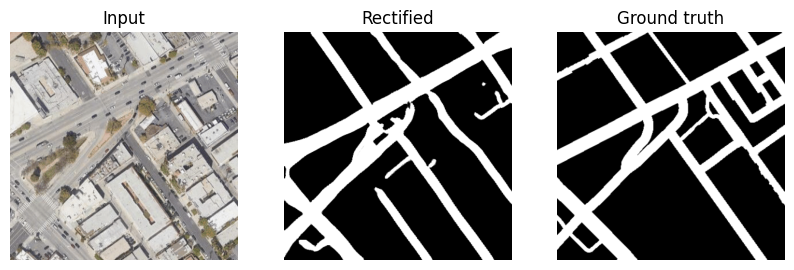

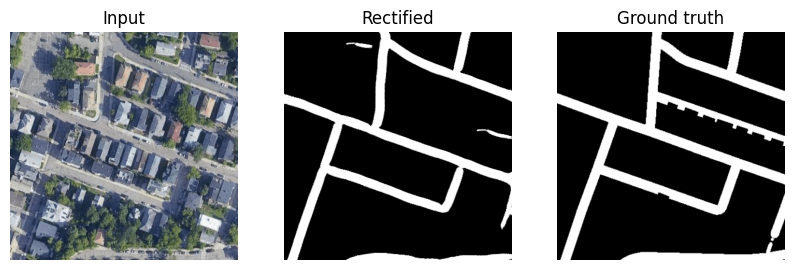

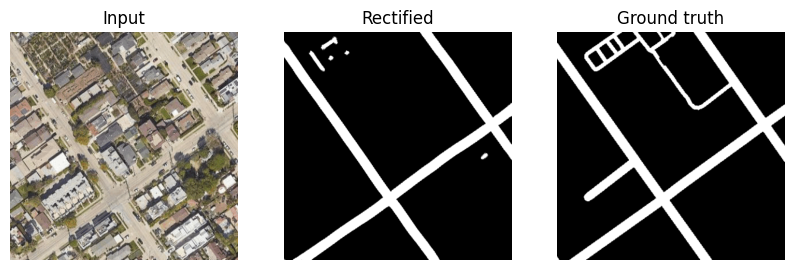

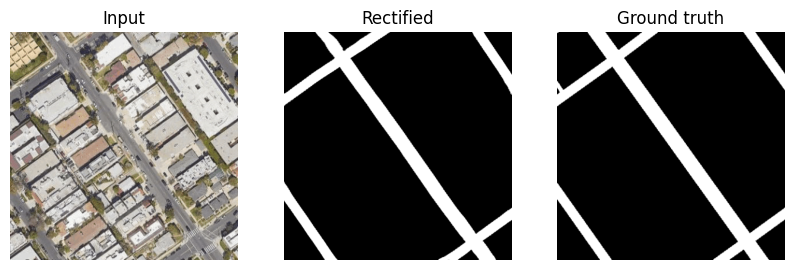

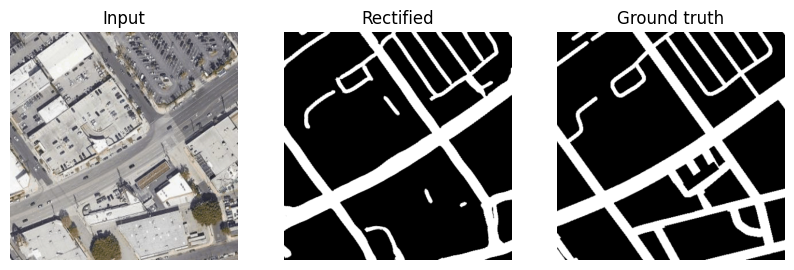

...

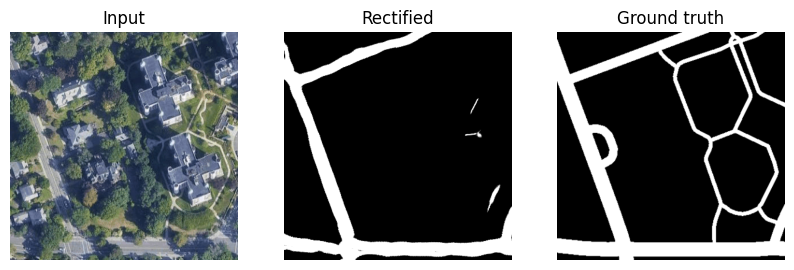

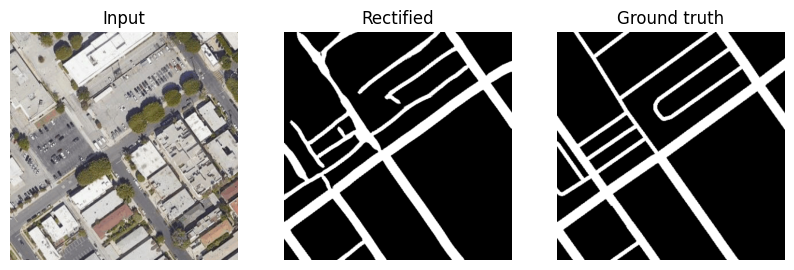

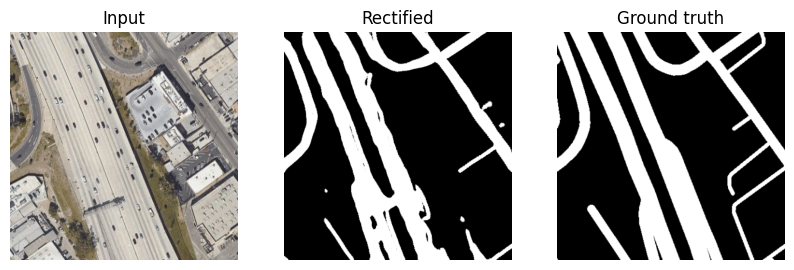

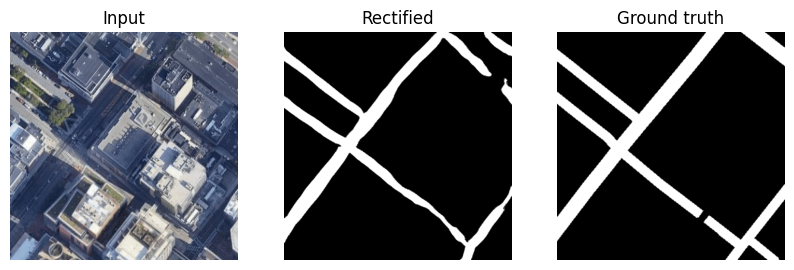

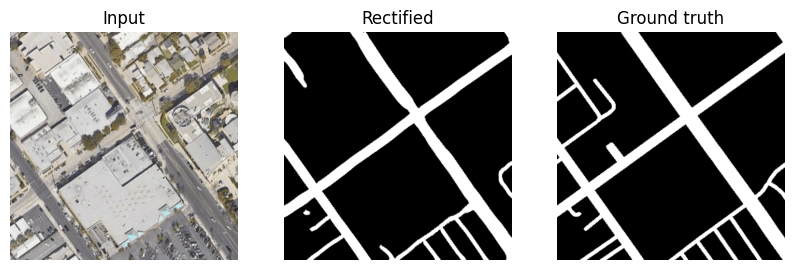

In [ ]:
# Sutando cycleGAN
def denormalize(tensor):
    """ Denormalize a tensor from [-1, 1] to [0, 1] """
    return (tensor + 1) / 2

with torch.no_grad():
    for idx in range(1, 15):
        idx = idx
        val_image = val_images_A[idx].to(device)
        predicted_val_mask = predicted_val_maps[idx].unsqueeze(0).to(device)
        val_mask = torch.Tensor(transform(val_masks[idx])).unsqueeze(0).to(device)
        # conditioned_val_mask = torch.concat((predicted_val_mask, val_image), dim=0)
#         z = torch.randn_like(predicted_val_mask).to(device)
#         x = torch.cat([z, predicted_val_mask, val_image], 0)
        x = torch.cat([predicted_val_mask, val_image], 0)
        rectified_val = G_A2B(x.unsqueeze(0))
        # Display images
        plt.figure(figsize=(10, 50))
        plt.subplot(3, 3, 1)
        plt.title("Input")
        # plt.imshow(val_image.unsqueeze(0).cpu().detach().numpy().transpose(0, 2, 3, 1)[0])
        plt.imshow(denormalize(predicted_val_mask.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.subplot(3, 3, 2)
        plt.title("Rectified")
    #     plt.imshow(denormalize(apply_gaussian_filter(predicted_val_mask.unsqueeze(0), gaussian_kernel_size, gaussian_sigma).cpu().detach().numpy().squeeze()), cmap='gray')
        plt.imshow(denormalize(rectified_val.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.subplot(3, 3, 3)
        plt.title("Ground truth")
        plt.imshow(denormalize(val_mask.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

    plt.show()

In [ ]:
# pix2pix
import matplotlib.pyplot as plt

def denormalize(tensor):
    """ Denormalize a tensor from [-1, 1] to [0, 1] """
    return (tensor + 1) / 2

with torch.no_grad():
    plt.figure(figsize=(10, 50))  # Adjust the figure size as needed

    for idx in range(14):
        val_image = val_images_A[idx].to(device)
        predicted_val_mask = predicted_val_maps[idx].unsqueeze(0).to(device)
        val_mask = torch.Tensor(transform(val_masks[idx])).unsqueeze(0).to(device)

        z = torch.randn_like(predicted_val_mask).to(device)
        x = torch.cat([z, predicted_val_mask, val_image], 0)
        rectified_val = generator(x.unsqueeze(0))

        # Display images
        plt.subplot(14, 3, idx * 3 + 1)
        plt.title(f"Input {idx+1}")
        plt.imshow(denormalize(predicted_val_mask.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.subplot(14, 3, idx * 3 + 2)
        plt.title(f"Rectified {idx+1}")
        plt.imshow(denormalize(rectified_val.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.subplot(14, 3, idx * 3 + 3)
        plt.title(f"Ground truth {idx+1}")
        plt.imshow(denormalize(val_mask.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import numpy as np
import math

def gaussian_kernel(size: int, sigma: float):
    """Generate a 2D Gaussian kernel."""
    kernel = torch.zeros((size, size))
    center = size // 2

    for i in range(size):
        for j in range(size):
            diff = (i - center) ** 2 + (j - center) ** 2
            kernel[i, j] = math.exp(-diff / (2 * sigma ** 2))

    kernel /= kernel.sum()
    return kernel

def apply_gaussian_filter(batch: torch.Tensor, kernel_size: int, sigma: float):
    """Apply Gaussian filter to a batch of tensors."""
    batch_size, channels, height, width = batch.shape
    kernel = gaussian_kernel(kernel_size, sigma).unsqueeze(0).unsqueeze(0)
    kernel = kernel.repeat(channels, 1, 1, 1).to(batch.device)

    padding = kernel_size // 2
    filtered_batch = F.conv2d(batch, kernel, padding=padding, groups=channels)
    return filtered_batch

gaussian_kernel_size = 5
gaussian_sigma = 1.0

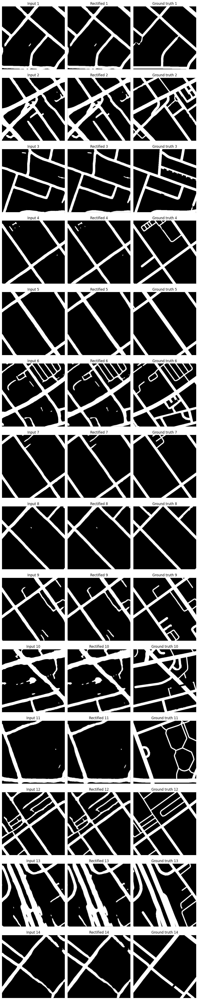

In [ ]:
# gaussian filter
import matplotlib.pyplot as plt

def denormalize(tensor):
    """ Denormalize a tensor from [-1, 1] to [0, 1] """
    return (tensor + 1) / 2

with torch.no_grad():
    plt.figure(figsize=(10, 50))  # Adjust the figure size as needed

    for idx in range(14):
        val_image = val_images_A[idx].to(device)
        predicted_val_mask = predicted_val_maps[idx].unsqueeze(0).to(device)
        val_mask = torch.Tensor(transform(val_masks[idx])).unsqueeze(0).to(device)

        z = torch.randn_like(predicted_val_mask).to(device)
        x = torch.cat([z, predicted_val_mask, val_image], 0)
        rectified_val = generator(x.unsqueeze(0))

        # Display images
        plt.subplot(14, 3, idx * 3 + 1)
        plt.title(f"Input {idx+1}")
        plt.imshow(denormalize(predicted_val_mask.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.subplot(14, 3, idx * 3 + 2)
        plt.title(f"Rectified {idx+1}")
        plt.imshow(denormalize(apply_gaussian_filter(predicted_val_mask.unsqueeze(0), gaussian_kernel_size, gaussian_sigma).cpu().detach().numpy().squeeze()), cmap='gray')

#         plt.imshow(denormalize(rectified_val.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

        plt.subplot(14, 3, idx * 3 + 3)
        plt.title(f"Ground truth {idx+1}")
        plt.imshow(denormalize(val_mask.cpu().detach().numpy().squeeze()), cmap='gray')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

### Ensembling

In [ ]:
import csv

def read_pred(file_str):
  preds = []
  first_col = []

  with open(f'/content/drive/MyDrive/{file_str}.csv') as file_obj:
      reader_obj = csv.reader(file_obj)

      for row in reader_obj:
          preds.append(row[1])
          first_col.append(row[0])

  return first_col, preds[1:] # skip the "prediction" line

first_col, preds1 = read_pred("merch1 - pix2pix")
_, preds2 = read_pred("merch2 - no post proc")
_, preds3 = read_pred("merch3 - cycle gan")

consesus = []
for i in range(len(preds1)):
  sum = int(preds1[i]) + int(preds2[i]) + int(preds3[i])
  if sum > 1:
    consesus.append(1)
  else:
    consesus.append(0)

first_col[0] = first_col[0] + ",prediction\n"

for i, l in enumerate(first_col[1:]):
  first_col[i+1] = l + f",{consesus[i]}\n"

with open("merched_submission.csv", 'w') as f:
  for line in first_col:
    f.write(line)

# Tips

In conclusion, we will go over some more or less specific tips for your project.

## On Road Segmentation
When you are completely new to a field, an efficient way to get yourself familar to it is to start from reading **overview**. We list several examples below:

* [Deep Learning Approaches Applied to Remote Sensing Datasets for Road Extraction: A State-Of-The-Art Review](https://www.mdpi.com/2072-4292/12/9/1444/htm)
* [Image Segmentation Using Deep Learning: A Survey](https://arxiv.org/pdf/2001.05566.pdf). This is a survey on the more general image segmentation problem

[**Transformer**](https://arxiv.org/pdf/1706.03762.pdf) has recently become a very popular choice in the task of image segmentation and boosted performances in many tasks. Some literatures for general task of image segmentation has been listed here. Notice that since Transformer is intrinsically data hungary, you should consider how to handle this deficiency like considering a pretrained model

* [Rethinking Semantic Segmentation from a Sequence-to-Sequence Perspective with Transformers](https://openaccess.thecvf.com/content/CVPR2021/papers/Zheng_Rethinking_Semantic_Segmentation_From_a_Sequence-to-Sequence_Perspective_With_Transformers_CVPR_2021_paper.pdf)
* [Segmenter: Transformer for Semantic Segmentation](https://arxiv.org/pdf/2105.05633.pdf)
* [SegFormer: Simple and Efficient Design for Semantic Segmentation with Transformers](https://proceedings.neurips.cc/paper/2021/file/64f1f27bf1b4ec22924fd0acb550c235-Paper.pdf)

For the concrete task of **road segmentation**, you can refer to following literatures

* [RoadTracer: Automatic Extraction of Road Networks from Aerial Images](https://openaccess.thecvf.com/content_cvpr_2018/papers/Bastani_RoadTracer_Automatic_Extraction_CVPR_2018_paper.pdf)
* [Road Detection and Segmentation from Aerial Images Using a CNN Based System](https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8441366)
* [Learning Aerial Image Segmentation from Online Maps](https://arxiv.org/abs/1707.06879)
* [Learning to Label Aerial Images from Noisy Data](https://www.cs.toronto.edu/~vmnih/docs/noisy_maps.pdf)
* [DeepGlobe 2018: A Challenge to Parse the Earth through Satellite Images](https://www.researchgate.net/publication/325215555_DeepGlobe_2018_A_Challenge_to_Parse_the_Earth_through_Satellite_Images)

## On CNNs

Research on CNNs has grown at an intense pace  in recent years. Listing the most influential papers in this context would be a very hard task, so we will just cite a few important works with no claim of completeness. While some of the presented models might not be directly applicable, they introduce interesting ideas.

* [ResNet](https://arxiv.org/abs/1512.03385)
* [Fully Convolutional Networks for Semantic Segmentation](https://arxiv.org/pdf/1411.4038.pdf)
* [DeepLab v1](https://arxiv.org/abs/1606.00915) (v2, v3 and v3+ also exist)
* [PsPNet](https://arxiv.org/abs/1612.01105)

## Concrete Tips
* The point of this project is not about topping the leader board in Kaggle competition, but is to have some novel and interesting ideas on this specific task.

* Besides coming up with interesting ideas, it is also important to present them well, since 70% your score is based on your report. You can use [this](http://www.da.inf.ethz.ch/teaching/2020/CIL/files/cil_sample.zip) as the template.

* Think about how task of road segmentation differs from general segmentation task may help you to generate some ideas.

* Explore the data in depth but **avoid information leakage**.

* Two fundamentals topics were skipped in this notebook, namely pre-processing and post-processing. Both are crucial to this project.

* **Hyperparameter tuning** is a tedious process, but it can have massive impact on your work. For general advices on this topic, you can refer to the book [*deep learning*](https://www.deeplearningbook.org/).

* You do not have to reinvent the wheel and code everything from scratch. Open source implementations of existing models can be a good starting point. On the other hand, coding your own models can be helpful to you as a learner.

* While they might not be interesting for reviewers, methods like ensembling can help you in the competitive part.

* **Be clear about your contribution and choose baselines accordingly.**

# Getting started with the project

### Google Colab:

Colaboratory, or "Colab" for short, allows you to write and execute Python in your browser, with
- Zero configuration required
- Free access to GPUs
- Easy sharing

[Introduction to Colab](https://www.youtube.com/watch?v=inN8seMm7UI) to learn more.

### ETH clusters

ETH provides access to the [Euler](https://scicomp.ethz.ch/wiki/Euler) and [Leonhard](https://scicomp.ethz.ch/wiki/Leonhard) cluster (see also [Getting started with clusters](https://scicomp.ethz.ch/wiki/Getting_started_with_clusters#SSH_keys)).

To start:
- Open [VPN](https://www.isg.inf.ethz.ch/Main/ServicesNetworkVPN)!
- [Setup SSH keys](https://scicomp.ethz.ch/wiki/Getting_started_with_clusters#SSH_keys) (only need to do that once).
- Can even run jupyter-notebooks via [this](https://scicomp.ethz.ch/wiki/Jupyter_on_Euler_and_Leonhard_Open). If you want to run with a GPU may need to change the file accordingly (line 64: "python_cpu/3.6.4" -> "python_gpu/x.x.x" see [this](https://scicomp.ethz.ch/wiki/Python_on_Leonhard) for available versions, line 139 to request a GPU change rusage demands). To see tensorboard results you can mount the remote directory
```
sshfs <ethz-username>@<cluster-hostname>:<directory>
```
and run tensorboard locally
```
tensorboard --logdir <directory>
```